In this assignment, you'll get hands-on experience coding and training Generative Adversarial Networks or GANs. We will implement a specific type of GAN designed to process images, called a Deep Convolutional GAN (DCGAN). We'll train the DCGAN to generate natural images from CIFAR10. Let's get started. 


A GAN is a generative model that has the following network structure:

![discriminator](https://drive.google.com/uc?export=view&id=19LkOTaowOrNhIKvjXWvO6qhFVUNZMF5Y)

A DCGAN is simply a GAN that uses a convolutional neural network as the discriminator, and a network composed of transposed convolutions as the generator. To implement the DCGAN, we need to specify three things: 


1.   the Discriminator
2.   the Generator
3.   the training Procedure



## **Part 1: Implement the Discriminator of the DCGAN**

The discriminator in the DCGAN you will implement is a convolutional neural network with the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=1KrqS_AyjHIm7leVh58pjVRmnGx-le1vB)


1.   **Padding**: In each of the convolutional layers shown above, we downsample the spatial dimension of the input volume by a factor of 2. Given that we kernel size $K=5$ and stride $S=2$, what should the padding be? Write your answer below in the colab, and show your work (i.e. the formula you used to derived the padding.)
2.   **Implementation**: Implement the above architecture in the ```define_discriminator``` routine below and return the model.






## Answer

To get the padding, we can use the equation we learned in class:

$r = \frac {n + 2p - f}{s}  + 1$,

to get the padding p:

$p = \frac {s(r-1) + f - n} {2}$,

where `s = stride = 2`, `f = kernel size = 5`, `p = padding`, `r = resultant dimension = 16`, and `n = input image dimensions = 32`

to get the following:

$p = 2$


##Discriminator Implementation

To define the discriminator, we note the following things about its structure from lecture:

- We can apply Batch Normalization everywhere except the discriminator input
- We use LeakyReLU for the discriminator

To build the model, we simply followed the diagram provided above, where we applies four convolutions. The last convolution we generated a 2x2x256, then applied `Flatten()` and then a FC layer.

In [2]:
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import numpy as np


def define_discriminator(input_shape=(32,32,3)):
	
	kernel = 5
	stride = 2

	assert input_shape == (32,32,3)
 
	# create model
	model = keras.Sequential()

	# 1st conv
	model.add(keras.layers.Conv2D(filters=32,kernel_size=kernel,padding='same',strides=stride,input_shape=(32,32,3)))
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.3))
	model.add(keras.layers.BatchNormalization())
	# print(f"1st conv2d: output_shape: {model.output_shape}")

	# 2nd conv
	model.add(keras.layers.Conv2D(filters=64,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.3))
	# print(f"2nd conv2d: output_shape: {model.output_shape}")

	# 3rd conv
	model.add(keras.layers.Conv2D(filters=128,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.3))
	# print(f"3rd conv2d: output_shape: {model.output_shape}")
	
	# 4th convolution
	model.add(keras.layers.Conv2D(filters=256,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
 
	# FC layer
	model.add(keras.layers.Flatten())
 
	# output
	model.add(keras.layers.Dense(1 ,activation='sigmoid'))
 
	# define optimizer
	opt = keras.optimizers.Adam(learning_rate=1e-5, beta_1 = 0.25)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

	return model


Using TensorFlow backend.


## **Part 2: Implement the Generator**

Now, we will implement the generator of the DCGAN in ```define_generator```, which consists of a sequence of transpose convolutional layers that progressively upsample the input noise sample to generate a fake image. Since the training of the generator involves an end-to-end cost function involving both the generator and the discriminator, you should also define a combined GAN model in ``define_gan``. Note that the discriminator portion is frozen (setting ``trainable`` to ``False``) as the weights of the discriminator are not modified during the training of the generator. The generator has the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=18RwpQChvU1FLfnCEfMiJKsKklsOkDyTS)



##Generator Implementation

To create the generator, we followed the structure presented in class, where:

- We apply Batch Normalization on all layers except for the generator output
- We apply ReLU through the generator except at the output
- At the output, we apply a `tanh` activation


To implement the generator, we also followed the diagram above and played around with the ReLU values. Since the input has an `input_shape` of dimenstion `100`, we made a dense layer and reshaped it to a 4x4x128. Then, we followed the diagram, following the number of filters, kernel stride, and kernel size as specified above. 

For the GAN, we set the discriminator training to `False` because we need to train the discriminator separately. In the GAN, we generate a latent vector of dimension 100 and put it through the generator. Then, we used the output fake image as the input to the discriminator to get a decision. This decision and the original latent vector are used to create the GAN model, since we want an output decision and a model that takes in a latent vector.

In [3]:
# define the standalone generator model
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import keras.initializers as initializers
import numpy as np

def define_generator(latent_dim=100):

    # create model   
    model = keras.Sequential()

    # reshape input to 4x4x128
    model.add(keras.layers.Dense(4*4*128, input_shape=(latent_dim,)))
    model.add(keras.layers.Reshape((4, 4, 128)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"after linear and reshape: output_shape: {model.output_shape}")

    # 1st conv
    model.add(keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"1st conv2d_transpose: output_shape: {model.output_shape}")
    
    # 2nd conv
    model.add(keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding='same'))    
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"2nd conv2d_transpose: output_shape: {model.output_shape}")

    # 3rd conv
    model.add(keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh'))
    # print(f"3rd conv2d_transpose: output_shape: {model.output_shape}")

    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):

  # make weights in the discriminator not trainable
  d_model.trainable = False
  
  # Define your combined model here 
  x = keras.layers.Input(shape=(100,))
  img = g_model(x)
  decision = d_model(img)

  
  model = keras.models.Model(inputs=x,outputs=decision)
  # G parameters
  model.compile(keras.optimizers.Adam(learning_rate=2e-4, beta_1 = 0.95), loss='binary_crossentropy', metrics=['binary_accuracy'])
  return model


# print out discriminator summary
discriminator = define_discriminator()
discriminator.summary()

# print out generator summary
generator = define_generator()
generator.summary()

# print out GAN summary
gan = define_gan(generator, discriminator)
gan.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 32)        2432      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 32)        128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 64)          256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 64)         

In [4]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## **Part 3: Training the model**

Instantiate the following routine ``train`` to train a DCGAN. The basic procedure goes like the followings. For each batch in each epoch: 

1.   Randomly sample a batch size of real images and give each of them a "real" label
2.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "fake" label.
3.   Use the data from 1 and 2 as training data to train only the discriminator 
4.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "real" label.
5.   Use the data to train the combined network. 

To monitor the progress, print out the performance of the discriminator network every episode and five randomly generated images every 5 episodes. As the training may take a significant amount of time, please save all the models in ``outputdir`` every episode in case you need to stop and restart the training process. 


##Training Implementation

To train the model, we assume the input dataset `dataset` is already divided into batches. Then, we can iterate through all the batches per epoch. In a single epoch, we convert the batch into a `numpy` list. This batch contains the $real$ $images$ that we will train our disriminator on. The $real$ $images$ are input to the discriminator are given $real$ $labels$ of the value $1$. So we have something like:

`d_loss_real_imgs = d_model.train_on_batch(real_data, np.ones((batch_size,1))`

We do the same thing for $fake$ $images$, where we can generate fake images from the generator model. The output is given $label = 0$, where we have

`d_loss_fake_imgs = d_model.train_on_batch(fake_data, np.zeros((batch_size,1))`

For the GAN, we train it with the input (100,). In the GAN, fake images will be generated and we given then a real label and get the loss.


In [5]:
import time
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.datasets import cifar10
import numpy as np

batch_size = 128

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, outputdir='/training_checkpoints/', latent_dim=100, n_epochs=400, n_batch=128):

  print(f"Number of epochs: {n_epochs}")
  print(f"Number of batches: {n_batch}")

  checkpoint_prefix = os.path.join(outputdir, "ckpt")
  model_filename = 'model_checkpoint'

  # go through all batches per epoch
  for epoch in range(n_epochs):

    start = time.time()

    # get a batch of real images and give them a real label
    for data_batch in dataset:

      # convert to numpy array
      # shape: 128x32x32x3
      data = np.stack(list(data_batch))

      # generate noise for creating fake images in step 2
      random_noise = np.random.normal(size=(n_batch,latent_dim))

      # train the discriminator
      d_model.training = True

      # compute the loss for the discriminator - compare the real images with a bunch of ones
      # ones are used to label 'real' images
      d_loss_real_imgs = d_model.train_on_batch(x=data, y=np.ones((128,1)))
      random_img = g_model.predict_on_batch(random_noise)
      d_loss_fake_imgs = d_model.train_on_batch(x=random_img, y=np.zeros((128,1)))

      loss = (d_loss_fake_imgs[0] + d_loss_real_imgs[0])

      d_model.training = False
      gan_loss = gan_model.train_on_batch(x=random_noise,y=np.ones((128,1)))

    print(f"epoch = {epoch+1}/{n_epochs}, d_loss={loss:0.3f}, g_loss={gan_loss[0]:0.3f}")

    if (epoch % 5 == 0):
        samples = 10
        x_fake = g_model.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))

        plt.tight_layout()
        plt.show()

    if(epoch + 1 % 20 == 0):
      # we will save model checkpoints to continue training in case of kernel death
      # model_filename_gan = 'gan_train.{0:03d}.hdf5'
      # model_filename_g = 'generator_train.{0:03d}.hdf5'
      # model_filename_d = 'discriminator_train.{0:03d}.hdf5'
      model_filename_gan = 'gan_train.hdf5'
      model_filename_g = 'generator_train.hdf5'
      model_filename_d = 'discriminator_train.hdf5'
      save_model(gan, model_filename_gan)
      save_model(gan, model_filename_g)
      save_model(gan, model_filename_d)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))





## **Part 4: Experiment**

This is where you put everything together and test it on CIFAR10. In the other part of the lab, you have already built a classifier for CIFAR10. For this experiment, you will use the same set of training images to build a DCGAN and then use the resulting generator to create 50,000 fake images. These fake images have no class labels but you can predict them using the classifier you built earlier. Now treating these fake images and predicted labels as training data, build a brand new classifier for CIFAR10 and compare its performance with the original one trained on the raw data. 

1.   Comment on any differences between their performances. Without running additional experiments, do you think the performance of the classifier trained on fake images will improve if you use 500,000 fake images instead of 50,000?
2.   You might wonder why anyone would use fake data to train classifier. As it turns out, this is a useful strategy to protect privacy of sensitive original data, especially in frederated learning when sensitive data need to be aggregated from many different sites. Inspecting a random set of fake images, do you think that they disclose any of the raw images from the original CIFAR10 dataset? 





###Answers to Q1 and Q2
1. Based on the results below, the images are much darker compared to the original CIFAR10 classifier trained on the original images. This is because the output images from the 100th epoch after training the DCGAN shows that the images are not clear and are dark in color. Our output from the generator is not that good. If we trained on 500k fake images from the generator, the output would not improve in this case, since the fake images are already wrong. If our DCGAN was well-trained though, then 500k results would improve the NN.

2. For a DCGAN that is working better than ours, then the output images generated by the GAN is different enough from the original images, so the raw images are not disclosed. Therefore, we can use the fake images instead of the original/raw images. Therefore, we believe that privacy comes in tandem with a well-trained model.


#**Experiment Implementation**

As mentioned in the previous instructions, what we did first was training a classifier, like in part 1

In [6]:
import tensorflow as tf
import keras
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import np_utils

# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential
from collections import defaultdict
import tqdm
from keras.models import save_model
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import cifar10

%tensorflow_version 1.x
%matplotlib inline

TensorFlow is already loaded. Please restart the runtime to change versions.


###Load cifar10 dataset

In [7]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

170500096/170498071 [==============================] - 2s 0us/step
Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


### Prepare data 

We need to normalize inputs like this: $$x_{norm} = \frac{x}{255} - 0.5$$

We need to convert class labels to one-hot encoded vectors. Use __keras.utils.to_categorical__.

In [8]:
# normalize inputs
x_train2  = [((x/255) - 0.5) for x in x_train]
x_train2 = np.array(x_train2)
x_test2   = [((x/255) - 0.5) for x in x_test]
x_test2 = np.array(x_test2)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_train)
print(y_train2.shape)
y_test2 = keras.utils.to_categorical(y_test)
print(y_test2.shape)

(50000, 10)
(10000, 10)


## Classifier CNN architecture

In [9]:
def make_model():

    NUM_CLASSES = 10

    model = Sequential()  # start feed-forward model definition

    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(32, 32, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())

    # model.add(Dense(256, input_shape=(50000,)))
    model.add(Dense(256))
    model.add(LeakyReLU(0.1))
    model.add(Dropout(0.5))
    
    model.add(Dense(NUM_CLASSES))  # the last layer with neuron for each class
    model.add(LeakyReLU(0.1))
    model.add(Activation("softmax"))  # output probabilities
    
    return model
  

### Train model

Training of your model can take approx. 4-8 minutes per epoch. The whole process takes approximately **1.5 hours**. You're aiming for ~0.80 validation accuracy.

During training you should observe the decrease in reported loss on training and validation.

If the loss on training is not decreasing with epochs you should revise your model definition and learning rate.

In [10]:
class TqdmProgressCallback(keras.callbacks.Callback):

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_begin(self, epoch, logs=None):
        print('Epoch %d/%d' % (epoch + 1, self.epochs))
        if "steps" in self.params:
            self.use_steps = True
            self.target = self.params['steps']
        else:
            self.use_steps = False
            self.target = self.params['samples']
        self.prog_bar = tqdm.tqdm_notebook(total=self.target)
        self.log_values_by_metric = defaultdict(list)

    def _set_prog_bar_desc(self, logs):
        for k in self.params['metrics']:
            if k in logs:
                self.log_values_by_metric[k].append(logs[k])
        desc = "; ".join("{0}: {1:.4f}".format(k, np.mean(values)) for k, values in self.log_values_by_metric.items())
        if hasattr(self.prog_bar, "set_description_str"):  # for new tqdm versions
            self.prog_bar.set_description_str(desc)
        else:
            self.prog_bar.set_description(desc)

    def on_batch_end(self, batch, logs=None):
        logs = logs or {}
        if self.use_steps:
            self.prog_bar.update(1)
        else:
            batch_size = logs.get('size', 0)
            self.prog_bar.update(batch_size)
        self._set_prog_bar_desc(logs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self._set_prog_bar_desc(logs)
        self.prog_bar.update(1)  # workaround to show description
        self.prog_bar.close()


class ModelSaveCallback(keras.callbacks.Callback):

    def __init__(self, file_name):
        super(ModelSaveCallback, self).__init__()
        self.file_name = file_name

    def on_epoch_end(self, epoch, logs=None):
        model_filename = self.file_name.format(epoch)
        save_model(self.model, model_filename)
        print("Model saved in {}".format(model_filename))

In [11]:
INIT_LR = 4.5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model = make_model()  # define our model
model.summary()

# prepare model for fitting (loss, optimizer, etc)
model.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.85 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
# model_filename = 'cifar.{0:03d}.hdf5'
model_filename = 'cifar.hdf5'
last_finished_epoch = None
#print(f"x_test2: {len(x_test2)}")

# fit model
model.fit(
    x_train2, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model.save_weights("weights.h5")

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 32)       

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.003825
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.00325125
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.0027635626
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.0023490281
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.0019966739
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0016971729
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.0014425969
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0012262074
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0010422763
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.0008859348
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0007530446
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.00064008794
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.00054407475
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0004624635
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.000393094
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.0003341299
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.0002840104
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00024140884
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00020519752
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00017441789
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.0001482552
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.00012601692
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.000107114385
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 9.104723e-05
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 7.739014e-05
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 6.578162e-05
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 5.591438e-05
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 4.752722e-05
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 4.039814e-05
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 3.433842e-05
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 2.9187655e-05
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 2.4809508e-05
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 2.108808e-05
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 1.792487e-05
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 1.5236139e-05
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 1.2950718e-05
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 1.100811e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 9.356893e-06
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 7.953359e-06
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 6.7603555e-06
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 5.746302e-06
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 4.8843567e-06
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.1517033e-06
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 3.528948e-06
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 2.9996056e-06
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 2.549665e-06
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 2.1672151e-06
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 1.8421329e-06
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 1.5658129e-06
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 1.330941e-06
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 1.1312999e-06
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 9.616049e-07
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 8.1736414e-07
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 6.9475954e-07
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 5.905456e-07
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 5.0196377e-07
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 4.2666917e-07
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 3.626688e-07
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 3.0826848e-07
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 2.620282e-07
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 2.2272398e-07
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 1.8931539e-07
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 1.6091808e-07
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 1.3678037e-07
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 1.1626331e-07
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 9.882381e-08
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 8.400024e-08
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 7.140021e-08
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 6.0690176e-08
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 5.158665e-08
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 4.384865e-08
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 3.7271352e-08
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 3.168065e-08
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 2.6928554e-08
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 2.288927e-08
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 1.9455879e-08
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.6537497e-08
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.4056873e-08
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.1948342e-08
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 1.0156091e-08
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 8.632677e-09
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 7.3377757e-09
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 6.237109e-09
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 5.3015428e-09
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 4.5063113e-09
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 3.8303645e-09
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 3.25581e-09
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 2.7674385e-09
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 2.3523228e-09
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 1.9994744e-09
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 1.6995532e-09
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 1.4446202e-09
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 1.2279272e-09
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 1.0437381e-09
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 8.871774e-10
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 7.541008e-10
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 6.4098565e-10
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 5.448378e-10
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 4.6311213e-10
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 3.936453e-10
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 3.3459852e-10
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 2.8440875e-10
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 2.4174743e-10
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 2.0548531e-10
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 1.7466252e-10
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 1.4846314e-10
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 1.2619367e-10
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 1.0726462e-10
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 9.117493e-11
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 7.749869e-11
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 6.587388e-11
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 5.59928e-11
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 4.759388e-11
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 4.04548e-11
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 3.438658e-11
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 2.9228592e-11
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 2.4844304e-11
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 2.1117658e-11
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.795001e-11
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.5257507e-11
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.2968881e-11
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.1023549e-11
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 9.370017e-12
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 7.9645145e-12
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 6.7698373e-12
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 5.754362e-12
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 4.8912072e-12
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 4.1575263e-12
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 3.5338974e-12
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 3.0038127e-12
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 2.5532408e-12
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 2.1702546e-12
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 1.8447164e-12
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 1.5680091e-12
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 1.3328077e-12
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 1.1328865e-12
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 9.629536e-13
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 8.185105e-13
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 6.9573394e-13
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 5.9137385e-13
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 5.026678e-13
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 4.272676e-13
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 3.6317745e-13
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 3.0870085e-13
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 2.623957e-13
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 2.2303637e-13
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 1.8958091e-13
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 1.6114378e-13
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 1.3697221e-13
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 1.1642637e-13
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 9.896242e-14
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 8.4118056e-14
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 7.150035e-14
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 6.077529e-14
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 5.1659e-14
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 4.391015e-14
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 3.732363e-14
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 3.1725084e-14
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.696632e-14
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.2921372e-14
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 1.9483167e-14
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.6560692e-14
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.4076588e-14
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.19651e-14
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.0170335e-14
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 8.644784e-15
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 7.348067e-15
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 6.245857e-15
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 5.3089785e-15
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 4.5126316e-15
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 3.835737e-15
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 3.2603764e-15
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 2.7713199e-15
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 2.355622e-15
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 2.0022787e-15
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 1.7019368e-15
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 1.4466463e-15
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 1.2296494e-15
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 1.0452019e-15
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 8.884216e-16
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 7.551584e-16
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 6.4188464e-16
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 5.45602e-16
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 4.6376166e-16
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 3.941974e-16
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 3.350678e-16
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 2.8480763e-16
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 2.420865e-16
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 2.0577351e-16
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 1.7490749e-16
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 1.4867137e-16
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 1.2637066e-16
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 1.0741506e-16
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 9.13028e-17
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 7.760738e-17
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 6.596627e-17
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 5.607133e-17
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 4.766063e-17
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 4.0511538e-17
Epoch 200/200



Model saved in cifar.hdf5


###Evaluate model

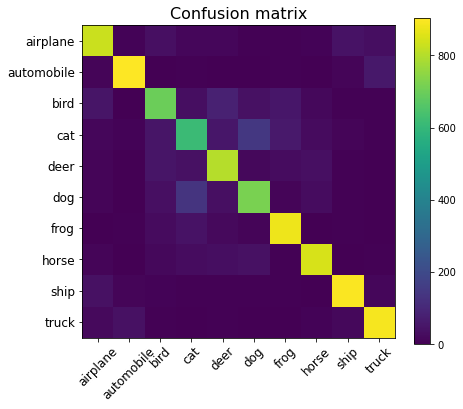

Test accuracy: 0.8089


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


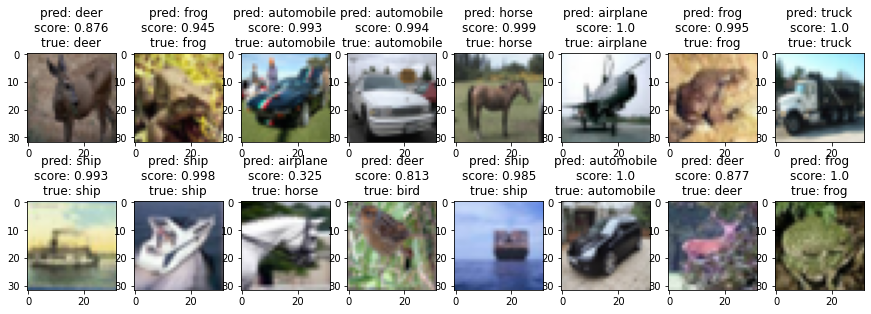

In [12]:
# load weights from file (can call without model.fit)
model.load_weights("weights.h5")

# make test predictions
y_pred_test = model.predict_proba(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

# Show the confusion matrix and accuracy
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

# inspect preditions
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid(b=False)
        ax.axis(b=False)
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

##Experiment
The implementation for the experiment follows the steps below in the code given by the original problem description. Here we used the model of the above classifier c, and then used it to train the fake images generated from the generator, and finally used the fake labels and the fake images to train the classifier c'. The result shows that the acccuracy of the classifier c is 0.7919 and the accuracy of the classifier c' is 0.1. In the training process, the epoch was set to 200 in order to see if there's an improved result compared to epoch = 100. However, the results were not improved much and the potential reson is due to the training for the original classifier still need to be improved in oder to get a better result for the classifier c'. 

Number of epochs: 400
Number of batches: 128


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch = 1/400, d_loss=0.577, g_loss=1.954


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:58: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


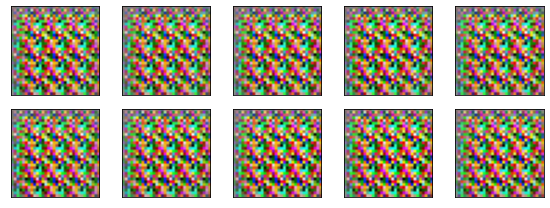

Time for epoch 1 is 27.301971435546875 sec
epoch = 2/400, d_loss=0.482, g_loss=2.087
Time for epoch 2 is 22.639272212982178 sec
epoch = 3/400, d_loss=1.039, g_loss=1.101
Time for epoch 3 is 22.479709148406982 sec
epoch = 4/400, d_loss=1.001, g_loss=1.067
Time for epoch 4 is 22.779911756515503 sec
epoch = 5/400, d_loss=1.135, g_loss=0.984
Time for epoch 5 is 22.420777082443237 sec
epoch = 6/400, d_loss=1.116, g_loss=1.074


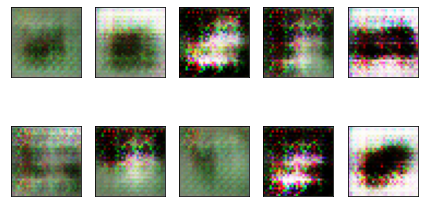

Time for epoch 6 is 22.741191148757935 sec
epoch = 7/400, d_loss=1.051, g_loss=1.019
Time for epoch 7 is 22.56898307800293 sec
epoch = 8/400, d_loss=1.273, g_loss=0.979
Time for epoch 8 is 22.20733880996704 sec
epoch = 9/400, d_loss=1.168, g_loss=0.923
Time for epoch 9 is 22.440844535827637 sec
epoch = 10/400, d_loss=1.261, g_loss=0.898
Time for epoch 10 is 23.01005744934082 sec
epoch = 11/400, d_loss=1.188, g_loss=0.984


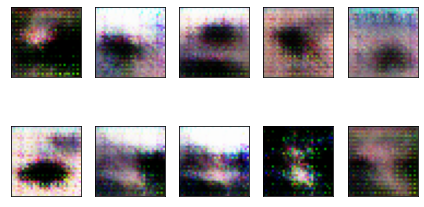

Time for epoch 11 is 23.087770700454712 sec
epoch = 12/400, d_loss=1.144, g_loss=0.982
Time for epoch 12 is 22.48293423652649 sec
epoch = 13/400, d_loss=1.069, g_loss=1.131
Time for epoch 13 is 22.394506692886353 sec
epoch = 14/400, d_loss=0.940, g_loss=1.342
Time for epoch 14 is 22.624476194381714 sec
epoch = 15/400, d_loss=0.783, g_loss=1.293
Time for epoch 15 is 22.435298919677734 sec
epoch = 16/400, d_loss=0.820, g_loss=1.219


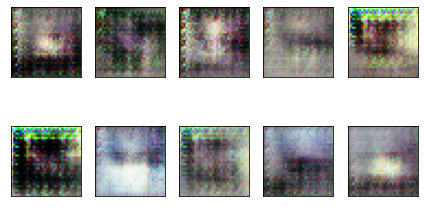

Time for epoch 16 is 22.81149458885193 sec
epoch = 17/400, d_loss=1.663, g_loss=0.700
Time for epoch 17 is 22.44240713119507 sec
epoch = 18/400, d_loss=1.425, g_loss=0.818
Time for epoch 18 is 22.330530881881714 sec
epoch = 19/400, d_loss=1.411, g_loss=0.759
Time for epoch 19 is 22.391646146774292 sec
epoch = 20/400, d_loss=1.385, g_loss=0.776
Time for epoch 20 is 22.436076641082764 sec
epoch = 21/400, d_loss=1.238, g_loss=0.860


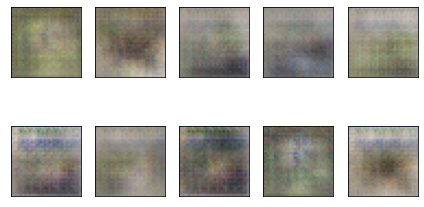

Time for epoch 21 is 22.88242769241333 sec
epoch = 22/400, d_loss=1.228, g_loss=0.840
Time for epoch 22 is 22.522518634796143 sec
epoch = 23/400, d_loss=1.318, g_loss=0.804
Time for epoch 23 is 22.62094759941101 sec
epoch = 24/400, d_loss=1.386, g_loss=0.787
Time for epoch 24 is 23.08219075202942 sec
epoch = 25/400, d_loss=1.414, g_loss=0.845
Time for epoch 25 is 22.448092699050903 sec
epoch = 26/400, d_loss=1.418, g_loss=0.779


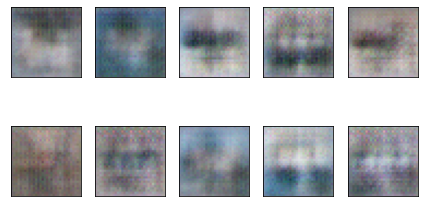

Time for epoch 26 is 22.748557329177856 sec
epoch = 27/400, d_loss=1.328, g_loss=0.842
Time for epoch 27 is 22.203861951828003 sec
epoch = 28/400, d_loss=1.260, g_loss=0.827
Time for epoch 28 is 22.531550407409668 sec
epoch = 29/400, d_loss=1.328, g_loss=0.778
Time for epoch 29 is 22.508567094802856 sec
epoch = 30/400, d_loss=1.439, g_loss=0.822
Time for epoch 30 is 22.518913507461548 sec
epoch = 31/400, d_loss=1.342, g_loss=0.795


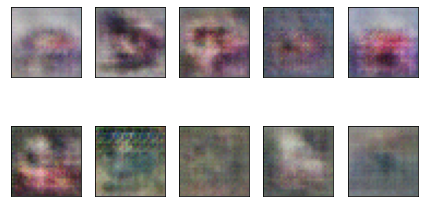

Time for epoch 31 is 22.74645161628723 sec
epoch = 32/400, d_loss=1.522, g_loss=0.739
Time for epoch 32 is 22.666818380355835 sec
epoch = 33/400, d_loss=1.454, g_loss=0.737
Time for epoch 33 is 22.44390082359314 sec
epoch = 34/400, d_loss=1.401, g_loss=0.750
Time for epoch 34 is 22.424217700958252 sec
epoch = 35/400, d_loss=1.411, g_loss=0.770
Time for epoch 35 is 22.629582405090332 sec
epoch = 36/400, d_loss=1.332, g_loss=0.792


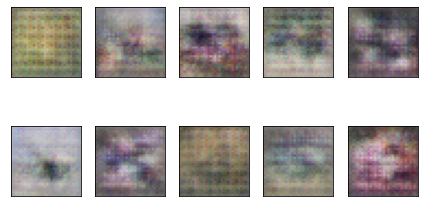

Time for epoch 36 is 22.549888372421265 sec
epoch = 37/400, d_loss=1.394, g_loss=0.730
Time for epoch 37 is 22.686529636383057 sec
epoch = 38/400, d_loss=1.446, g_loss=0.756
Time for epoch 38 is 22.85538339614868 sec
epoch = 39/400, d_loss=1.370, g_loss=0.738
Time for epoch 39 is 22.59991717338562 sec
epoch = 40/400, d_loss=1.480, g_loss=0.700
Time for epoch 40 is 22.506202697753906 sec
epoch = 41/400, d_loss=1.331, g_loss=0.767


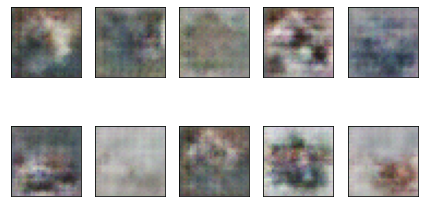

Time for epoch 41 is 22.818339347839355 sec
epoch = 42/400, d_loss=1.356, g_loss=0.753
Time for epoch 42 is 22.53444004058838 sec
epoch = 43/400, d_loss=1.348, g_loss=0.778
Time for epoch 43 is 22.46582841873169 sec
epoch = 44/400, d_loss=1.428, g_loss=0.730
Time for epoch 44 is 22.424006938934326 sec
epoch = 45/400, d_loss=1.382, g_loss=0.730
Time for epoch 45 is 22.231731176376343 sec
epoch = 46/400, d_loss=1.370, g_loss=0.763


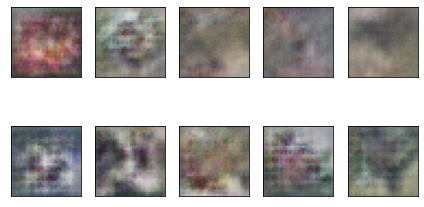

Time for epoch 46 is 22.85094380378723 sec
epoch = 47/400, d_loss=1.394, g_loss=0.707
Time for epoch 47 is 22.39018988609314 sec
epoch = 48/400, d_loss=1.399, g_loss=0.751
Time for epoch 48 is 22.356848001480103 sec
epoch = 49/400, d_loss=1.503, g_loss=0.686
Time for epoch 49 is 22.42505407333374 sec
epoch = 50/400, d_loss=1.354, g_loss=0.763
Time for epoch 50 is 22.570162296295166 sec
epoch = 51/400, d_loss=1.393, g_loss=0.766


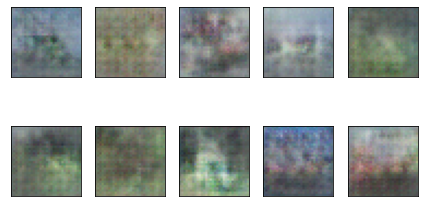

Time for epoch 51 is 23.040045976638794 sec
epoch = 52/400, d_loss=1.363, g_loss=0.761
Time for epoch 52 is 22.897683143615723 sec
epoch = 53/400, d_loss=1.395, g_loss=0.766
Time for epoch 53 is 22.47619080543518 sec
epoch = 54/400, d_loss=1.403, g_loss=0.766
Time for epoch 54 is 22.310504913330078 sec
epoch = 55/400, d_loss=1.390, g_loss=0.811
Time for epoch 55 is 22.32308030128479 sec
epoch = 56/400, d_loss=1.437, g_loss=0.756


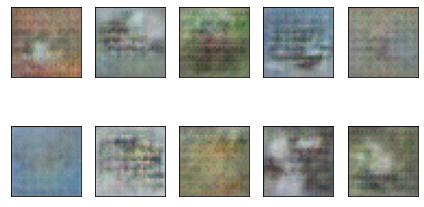

Time for epoch 56 is 22.82870650291443 sec
epoch = 57/400, d_loss=1.335, g_loss=0.777
Time for epoch 57 is 22.312429666519165 sec
epoch = 58/400, d_loss=1.365, g_loss=0.795
Time for epoch 58 is 22.37619662284851 sec
epoch = 59/400, d_loss=1.318, g_loss=0.788
Time for epoch 59 is 22.348093271255493 sec
epoch = 60/400, d_loss=1.392, g_loss=0.744
Time for epoch 60 is 22.43826150894165 sec
epoch = 61/400, d_loss=1.349, g_loss=0.782


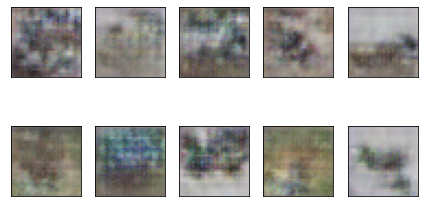

Time for epoch 61 is 22.63025212287903 sec
epoch = 62/400, d_loss=1.386, g_loss=0.710
Time for epoch 62 is 22.387937784194946 sec
epoch = 63/400, d_loss=1.486, g_loss=0.715
Time for epoch 63 is 22.379883766174316 sec
epoch = 64/400, d_loss=1.409, g_loss=0.730
Time for epoch 64 is 22.62616229057312 sec
epoch = 65/400, d_loss=1.383, g_loss=0.723
Time for epoch 65 is 22.58082675933838 sec
epoch = 66/400, d_loss=1.337, g_loss=0.752


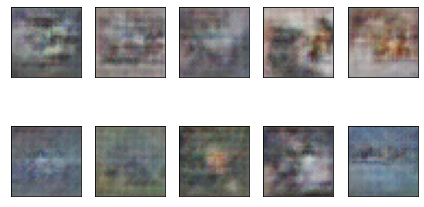

Time for epoch 66 is 23.06077218055725 sec
epoch = 67/400, d_loss=1.421, g_loss=0.716
Time for epoch 67 is 22.51391100883484 sec
epoch = 68/400, d_loss=1.380, g_loss=0.757
Time for epoch 68 is 22.398016214370728 sec
epoch = 69/400, d_loss=1.367, g_loss=0.725
Time for epoch 69 is 22.34837794303894 sec
epoch = 70/400, d_loss=1.353, g_loss=0.775
Time for epoch 70 is 22.298799514770508 sec
epoch = 71/400, d_loss=1.379, g_loss=0.789


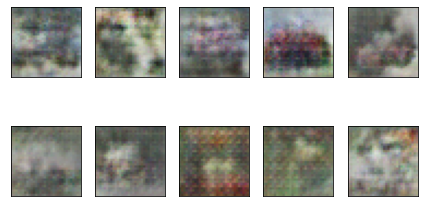

Time for epoch 71 is 22.82183051109314 sec
epoch = 72/400, d_loss=1.394, g_loss=0.759
Time for epoch 72 is 22.38680672645569 sec
epoch = 73/400, d_loss=1.426, g_loss=0.724
Time for epoch 73 is 22.418596267700195 sec
epoch = 74/400, d_loss=1.363, g_loss=0.711
Time for epoch 74 is 22.297908067703247 sec
epoch = 75/400, d_loss=1.428, g_loss=0.683
Time for epoch 75 is 22.427839756011963 sec
epoch = 76/400, d_loss=1.423, g_loss=0.705


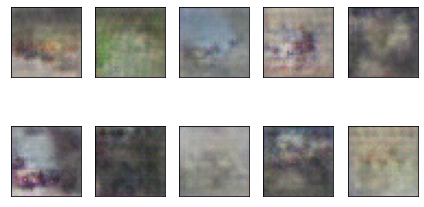

Time for epoch 76 is 22.657902240753174 sec
epoch = 77/400, d_loss=1.396, g_loss=0.726
Time for epoch 77 is 22.380287408828735 sec
epoch = 78/400, d_loss=1.396, g_loss=0.689
Time for epoch 78 is 22.70987367630005 sec
epoch = 79/400, d_loss=1.383, g_loss=0.707
Time for epoch 79 is 22.666916847229004 sec
epoch = 80/400, d_loss=1.351, g_loss=0.744
Time for epoch 80 is 22.449339389801025 sec
epoch = 81/400, d_loss=1.430, g_loss=0.707


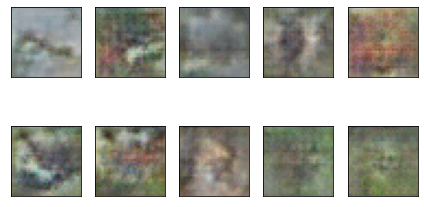

Time for epoch 81 is 22.803781032562256 sec
epoch = 82/400, d_loss=1.335, g_loss=0.713
Time for epoch 82 is 22.340325593948364 sec
epoch = 83/400, d_loss=1.406, g_loss=0.724
Time for epoch 83 is 22.312427759170532 sec
epoch = 84/400, d_loss=1.275, g_loss=0.755
Time for epoch 84 is 22.339725255966187 sec
epoch = 85/400, d_loss=1.342, g_loss=0.753
Time for epoch 85 is 22.441102743148804 sec
epoch = 86/400, d_loss=1.369, g_loss=0.762


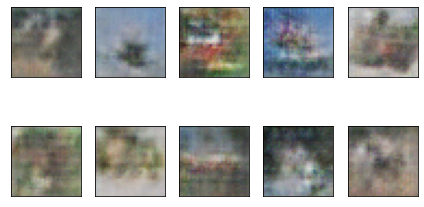

Time for epoch 86 is 22.800090789794922 sec
epoch = 87/400, d_loss=1.402, g_loss=0.753
Time for epoch 87 is 22.411258459091187 sec
epoch = 88/400, d_loss=1.355, g_loss=0.730
Time for epoch 88 is 22.312482595443726 sec
epoch = 89/400, d_loss=1.414, g_loss=0.717
Time for epoch 89 is 22.573957204818726 sec
epoch = 90/400, d_loss=1.408, g_loss=0.712
Time for epoch 90 is 22.39002776145935 sec
epoch = 91/400, d_loss=1.414, g_loss=0.739


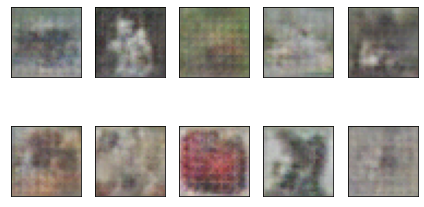

Time for epoch 91 is 23.147926807403564 sec
epoch = 92/400, d_loss=1.442, g_loss=0.687
Time for epoch 92 is 22.71812343597412 sec
epoch = 93/400, d_loss=1.359, g_loss=0.752
Time for epoch 93 is 23.19389033317566 sec
epoch = 94/400, d_loss=1.393, g_loss=0.728
Time for epoch 94 is 22.968274116516113 sec
epoch = 95/400, d_loss=1.380, g_loss=0.729
Time for epoch 95 is 22.71203637123108 sec
epoch = 96/400, d_loss=1.370, g_loss=0.724


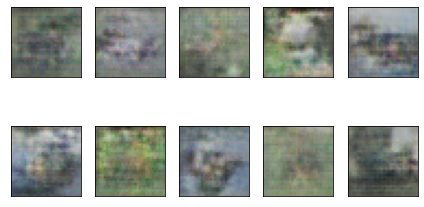

Time for epoch 96 is 23.727071523666382 sec
epoch = 97/400, d_loss=1.358, g_loss=0.720
Time for epoch 97 is 22.585440397262573 sec
epoch = 98/400, d_loss=1.416, g_loss=0.716
Time for epoch 98 is 22.489485025405884 sec
epoch = 99/400, d_loss=1.355, g_loss=0.763
Time for epoch 99 is 22.535858392715454 sec
epoch = 100/400, d_loss=1.371, g_loss=0.773
Time for epoch 100 is 22.68950605392456 sec
epoch = 101/400, d_loss=1.412, g_loss=0.724


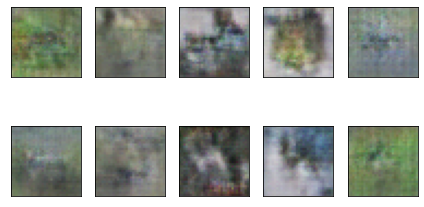

Time for epoch 101 is 22.77720332145691 sec
epoch = 102/400, d_loss=1.391, g_loss=0.733
Time for epoch 102 is 22.497950077056885 sec
epoch = 103/400, d_loss=1.390, g_loss=0.721
Time for epoch 103 is 22.547213077545166 sec
epoch = 104/400, d_loss=1.404, g_loss=0.726
Time for epoch 104 is 22.461905241012573 sec
epoch = 105/400, d_loss=1.390, g_loss=0.749
Time for epoch 105 is 22.375154733657837 sec
epoch = 106/400, d_loss=1.381, g_loss=0.709


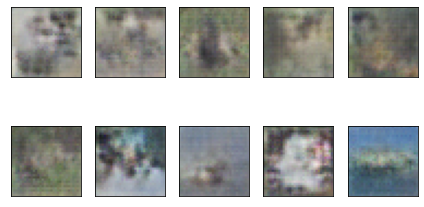

Time for epoch 106 is 22.801400423049927 sec
epoch = 107/400, d_loss=1.410, g_loss=0.721
Time for epoch 107 is 23.068284273147583 sec
epoch = 108/400, d_loss=1.408, g_loss=0.733
Time for epoch 108 is 22.446515321731567 sec
epoch = 109/400, d_loss=1.384, g_loss=0.742
Time for epoch 109 is 22.430968284606934 sec
epoch = 110/400, d_loss=1.369, g_loss=0.750
Time for epoch 110 is 22.571775197982788 sec
epoch = 111/400, d_loss=1.414, g_loss=0.727


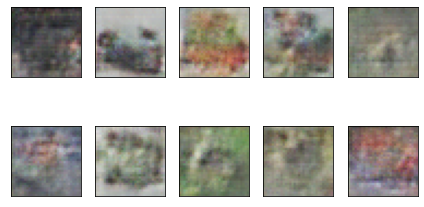

Time for epoch 111 is 22.72291135787964 sec
epoch = 112/400, d_loss=1.355, g_loss=0.728
Time for epoch 112 is 22.44456386566162 sec
epoch = 113/400, d_loss=1.355, g_loss=0.733
Time for epoch 113 is 22.40988278388977 sec
epoch = 114/400, d_loss=1.376, g_loss=0.721
Time for epoch 114 is 22.64242696762085 sec
epoch = 115/400, d_loss=1.427, g_loss=0.728
Time for epoch 115 is 22.144877433776855 sec
epoch = 116/400, d_loss=1.418, g_loss=0.728


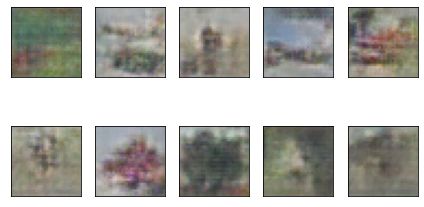

Time for epoch 116 is 22.773993015289307 sec
epoch = 117/400, d_loss=1.364, g_loss=0.749
Time for epoch 117 is 22.5630943775177 sec
epoch = 118/400, d_loss=1.400, g_loss=0.709
Time for epoch 118 is 22.704742193222046 sec
epoch = 119/400, d_loss=1.344, g_loss=0.750
Time for epoch 119 is 22.409021139144897 sec
epoch = 120/400, d_loss=1.393, g_loss=0.718
Time for epoch 120 is 22.58917498588562 sec
epoch = 121/400, d_loss=1.360, g_loss=0.706


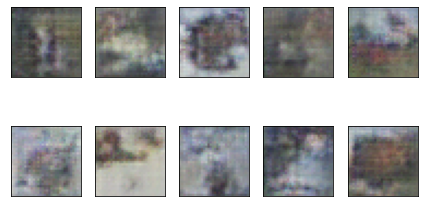

Time for epoch 121 is 23.235195636749268 sec
epoch = 122/400, d_loss=1.394, g_loss=0.706
Time for epoch 122 is 22.36007809638977 sec
epoch = 123/400, d_loss=1.412, g_loss=0.663
Time for epoch 123 is 22.387912034988403 sec
epoch = 124/400, d_loss=1.363, g_loss=0.739
Time for epoch 124 is 22.563436269760132 sec
epoch = 125/400, d_loss=1.403, g_loss=0.712
Time for epoch 125 is 22.588635206222534 sec
epoch = 126/400, d_loss=1.398, g_loss=0.761


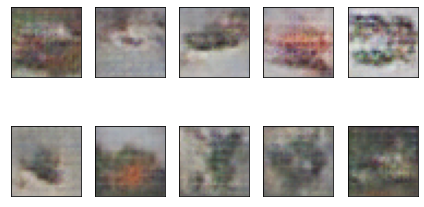

Time for epoch 126 is 22.623794555664062 sec
epoch = 127/400, d_loss=1.396, g_loss=0.751
Time for epoch 127 is 22.373565912246704 sec
epoch = 128/400, d_loss=1.373, g_loss=0.716
Time for epoch 128 is 22.545751333236694 sec
epoch = 129/400, d_loss=1.415, g_loss=0.729
Time for epoch 129 is 22.397727966308594 sec
epoch = 130/400, d_loss=1.396, g_loss=0.745
Time for epoch 130 is 22.33817458152771 sec
epoch = 131/400, d_loss=1.390, g_loss=0.721


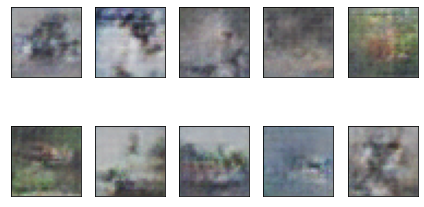

Time for epoch 131 is 22.965030908584595 sec
epoch = 132/400, d_loss=1.366, g_loss=0.722
Time for epoch 132 is 22.683230876922607 sec
epoch = 133/400, d_loss=1.397, g_loss=0.708
Time for epoch 133 is 22.38111639022827 sec
epoch = 134/400, d_loss=1.381, g_loss=0.731
Time for epoch 134 is 22.747479915618896 sec
epoch = 135/400, d_loss=1.379, g_loss=0.715
Time for epoch 135 is 22.590476274490356 sec
epoch = 136/400, d_loss=1.412, g_loss=0.731


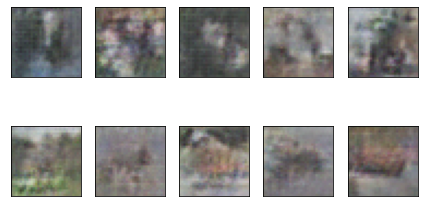

Time for epoch 136 is 22.77388310432434 sec
epoch = 137/400, d_loss=1.388, g_loss=0.706
Time for epoch 137 is 22.550015687942505 sec
epoch = 138/400, d_loss=1.387, g_loss=0.701
Time for epoch 138 is 22.450138092041016 sec
epoch = 139/400, d_loss=1.381, g_loss=0.701
Time for epoch 139 is 22.526376247406006 sec
epoch = 140/400, d_loss=1.369, g_loss=0.723
Time for epoch 140 is 22.528918743133545 sec
epoch = 141/400, d_loss=1.375, g_loss=0.757


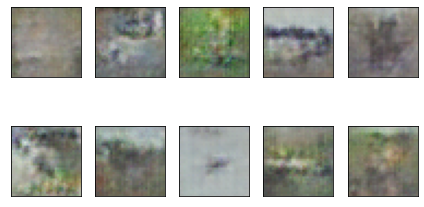

Time for epoch 141 is 22.850160121917725 sec
epoch = 142/400, d_loss=1.383, g_loss=0.728
Time for epoch 142 is 22.68592858314514 sec
epoch = 143/400, d_loss=1.365, g_loss=0.716
Time for epoch 143 is 22.510361671447754 sec
epoch = 144/400, d_loss=1.402, g_loss=0.734
Time for epoch 144 is 22.458787202835083 sec
epoch = 145/400, d_loss=1.371, g_loss=0.713
Time for epoch 145 is 22.634501695632935 sec
epoch = 146/400, d_loss=1.386, g_loss=0.745


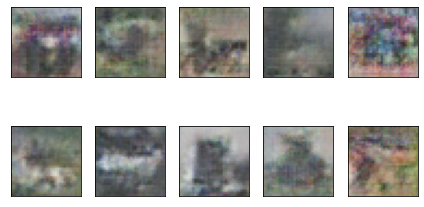

Time for epoch 146 is 22.90159010887146 sec
epoch = 147/400, d_loss=1.405, g_loss=0.731
Time for epoch 147 is 22.48392677307129 sec
epoch = 148/400, d_loss=1.357, g_loss=0.717
Time for epoch 148 is 22.9617919921875 sec
epoch = 149/400, d_loss=1.384, g_loss=0.736
Time for epoch 149 is 22.648942947387695 sec
epoch = 150/400, d_loss=1.357, g_loss=0.770
Time for epoch 150 is 22.56226420402527 sec
epoch = 151/400, d_loss=1.395, g_loss=0.712


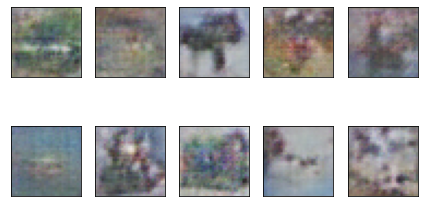

Time for epoch 151 is 22.807522773742676 sec
epoch = 152/400, d_loss=1.370, g_loss=0.735
Time for epoch 152 is 22.670791149139404 sec
epoch = 153/400, d_loss=1.408, g_loss=0.736
Time for epoch 153 is 22.68479871749878 sec
epoch = 154/400, d_loss=1.349, g_loss=0.727
Time for epoch 154 is 22.491185903549194 sec
epoch = 155/400, d_loss=1.371, g_loss=0.729
Time for epoch 155 is 22.372769594192505 sec
epoch = 156/400, d_loss=1.376, g_loss=0.738


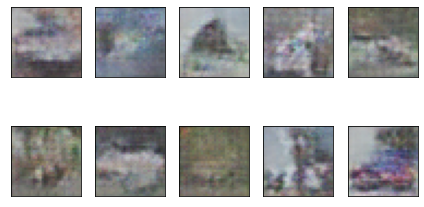

Time for epoch 156 is 22.97743821144104 sec
epoch = 157/400, d_loss=1.368, g_loss=0.735
Time for epoch 157 is 22.546912670135498 sec
epoch = 158/400, d_loss=1.398, g_loss=0.721
Time for epoch 158 is 22.526487588882446 sec
epoch = 159/400, d_loss=1.381, g_loss=0.710
Time for epoch 159 is 22.67911720275879 sec
epoch = 160/400, d_loss=1.373, g_loss=0.679
Time for epoch 160 is 22.722817182540894 sec
epoch = 161/400, d_loss=1.350, g_loss=0.736


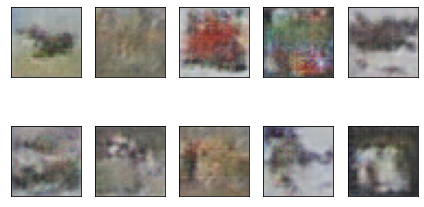

Time for epoch 161 is 22.82759737968445 sec
epoch = 162/400, d_loss=1.405, g_loss=0.696
Time for epoch 162 is 22.972726106643677 sec
epoch = 163/400, d_loss=1.390, g_loss=0.729
Time for epoch 163 is 22.490437269210815 sec
epoch = 164/400, d_loss=1.399, g_loss=0.697
Time for epoch 164 is 22.601848602294922 sec
epoch = 165/400, d_loss=1.427, g_loss=0.719
Time for epoch 165 is 22.530149221420288 sec
epoch = 166/400, d_loss=1.390, g_loss=0.704


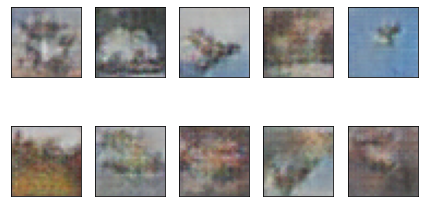

Time for epoch 166 is 22.851263761520386 sec
epoch = 167/400, d_loss=1.404, g_loss=0.715
Time for epoch 167 is 22.68481206893921 sec
epoch = 168/400, d_loss=1.368, g_loss=0.721
Time for epoch 168 is 22.513319969177246 sec
epoch = 169/400, d_loss=1.359, g_loss=0.701
Time for epoch 169 is 22.491857290267944 sec
epoch = 170/400, d_loss=1.386, g_loss=0.744
Time for epoch 170 is 22.507426500320435 sec
epoch = 171/400, d_loss=1.336, g_loss=0.726


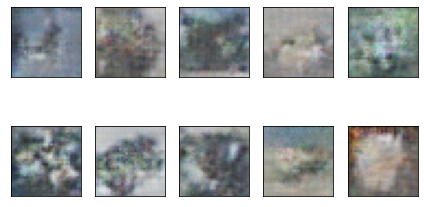

Time for epoch 171 is 23.179884433746338 sec
epoch = 172/400, d_loss=1.366, g_loss=0.738
Time for epoch 172 is 22.57867121696472 sec
epoch = 173/400, d_loss=1.366, g_loss=0.707
Time for epoch 173 is 22.485528707504272 sec
epoch = 174/400, d_loss=1.373, g_loss=0.699
Time for epoch 174 is 22.62076497077942 sec
epoch = 175/400, d_loss=1.349, g_loss=0.732
Time for epoch 175 is 22.75228786468506 sec
epoch = 176/400, d_loss=1.403, g_loss=0.708


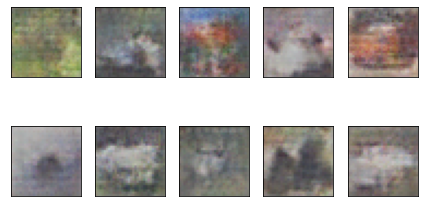

Time for epoch 176 is 22.90785789489746 sec
epoch = 177/400, d_loss=1.362, g_loss=0.738
Time for epoch 177 is 22.45530343055725 sec
epoch = 178/400, d_loss=1.374, g_loss=0.690
Time for epoch 178 is 22.63777232170105 sec
epoch = 179/400, d_loss=1.388, g_loss=0.715
Time for epoch 179 is 22.565840244293213 sec
epoch = 180/400, d_loss=1.390, g_loss=0.708
Time for epoch 180 is 22.612571239471436 sec
epoch = 181/400, d_loss=1.348, g_loss=0.691


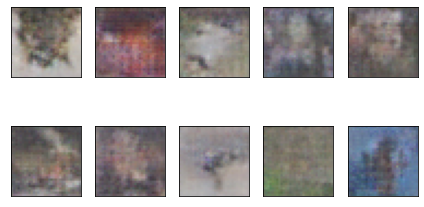

Time for epoch 181 is 23.074434518814087 sec
epoch = 182/400, d_loss=1.413, g_loss=0.690
Time for epoch 182 is 22.65559720993042 sec
epoch = 183/400, d_loss=1.420, g_loss=0.740
Time for epoch 183 is 22.48361897468567 sec
epoch = 184/400, d_loss=1.405, g_loss=0.696
Time for epoch 184 is 22.502883195877075 sec
epoch = 185/400, d_loss=1.386, g_loss=0.719
Time for epoch 185 is 22.71582841873169 sec
epoch = 186/400, d_loss=1.423, g_loss=0.707


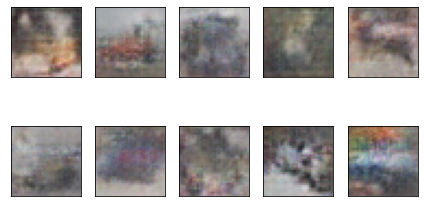

Time for epoch 186 is 22.999518156051636 sec
epoch = 187/400, d_loss=1.405, g_loss=0.729
Time for epoch 187 is 22.614271879196167 sec
epoch = 188/400, d_loss=1.402, g_loss=0.699
Time for epoch 188 is 22.65047836303711 sec
epoch = 189/400, d_loss=1.393, g_loss=0.728
Time for epoch 189 is 23.08701205253601 sec
epoch = 190/400, d_loss=1.366, g_loss=0.733
Time for epoch 190 is 22.502687454223633 sec
epoch = 191/400, d_loss=1.369, g_loss=0.720


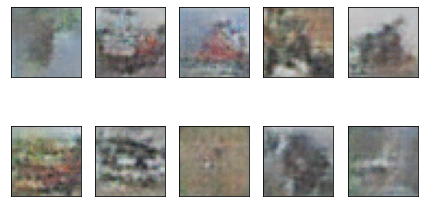

Time for epoch 191 is 22.789471864700317 sec
epoch = 192/400, d_loss=1.393, g_loss=0.721
Time for epoch 192 is 22.74711775779724 sec
epoch = 193/400, d_loss=1.399, g_loss=0.684
Time for epoch 193 is 22.490674018859863 sec
epoch = 194/400, d_loss=1.357, g_loss=0.718
Time for epoch 194 is 22.47330093383789 sec
epoch = 195/400, d_loss=1.361, g_loss=0.694
Time for epoch 195 is 22.56752300262451 sec
epoch = 196/400, d_loss=1.397, g_loss=0.686


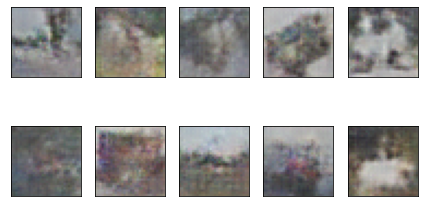

Time for epoch 196 is 22.93500566482544 sec
epoch = 197/400, d_loss=1.352, g_loss=0.737
Time for epoch 197 is 22.60614585876465 sec
epoch = 198/400, d_loss=1.384, g_loss=0.722
Time for epoch 198 is 22.489173889160156 sec
epoch = 199/400, d_loss=1.371, g_loss=0.727
Time for epoch 199 is 22.906555652618408 sec
epoch = 200/400, d_loss=1.378, g_loss=0.710
Time for epoch 200 is 22.43763756752014 sec
epoch = 201/400, d_loss=1.368, g_loss=0.705


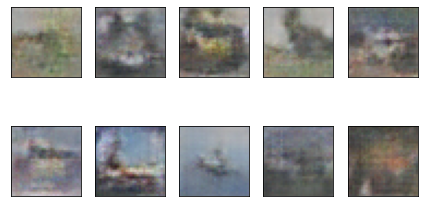

Time for epoch 201 is 22.862204790115356 sec
epoch = 202/400, d_loss=1.384, g_loss=0.676
Time for epoch 202 is 22.580739974975586 sec
epoch = 203/400, d_loss=1.400, g_loss=0.703
Time for epoch 203 is 22.96308946609497 sec
epoch = 204/400, d_loss=1.359, g_loss=0.738
Time for epoch 204 is 22.510683059692383 sec
epoch = 205/400, d_loss=1.387, g_loss=0.715
Time for epoch 205 is 22.375816583633423 sec
epoch = 206/400, d_loss=1.356, g_loss=0.735


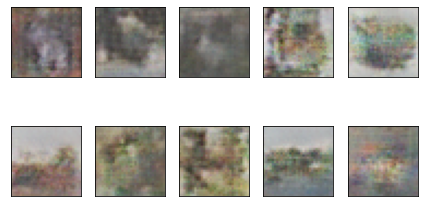

Time for epoch 206 is 23.011282444000244 sec
epoch = 207/400, d_loss=1.377, g_loss=0.726
Time for epoch 207 is 22.575228214263916 sec
epoch = 208/400, d_loss=1.390, g_loss=0.728
Time for epoch 208 is 22.53172779083252 sec
epoch = 209/400, d_loss=1.382, g_loss=0.686
Time for epoch 209 is 22.48452663421631 sec
epoch = 210/400, d_loss=1.383, g_loss=0.735
Time for epoch 210 is 22.549691200256348 sec
epoch = 211/400, d_loss=1.374, g_loss=0.705


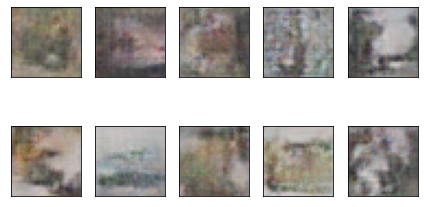

Time for epoch 211 is 23.1103196144104 sec
epoch = 212/400, d_loss=1.360, g_loss=0.736
Time for epoch 212 is 22.55806565284729 sec
epoch = 213/400, d_loss=1.368, g_loss=0.707
Time for epoch 213 is 22.599690914154053 sec
epoch = 214/400, d_loss=1.381, g_loss=0.716
Time for epoch 214 is 22.41830611228943 sec
epoch = 215/400, d_loss=1.373, g_loss=0.726
Time for epoch 215 is 22.485604286193848 sec
epoch = 216/400, d_loss=1.363, g_loss=0.744


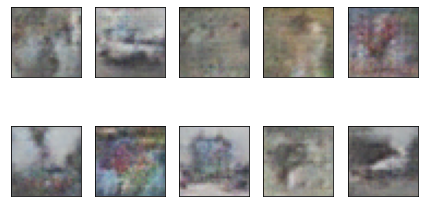

Time for epoch 216 is 23.026225566864014 sec
epoch = 217/400, d_loss=1.388, g_loss=0.709
Time for epoch 217 is 23.142991065979004 sec
epoch = 218/400, d_loss=1.386, g_loss=0.728
Time for epoch 218 is 22.7187077999115 sec
epoch = 219/400, d_loss=1.369, g_loss=0.715
Time for epoch 219 is 22.559842109680176 sec
epoch = 220/400, d_loss=1.385, g_loss=0.722
Time for epoch 220 is 22.616889476776123 sec
epoch = 221/400, d_loss=1.348, g_loss=0.725


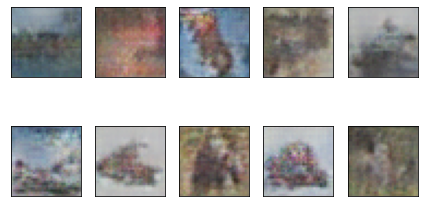

Time for epoch 221 is 22.78478193283081 sec
epoch = 222/400, d_loss=1.373, g_loss=0.711
Time for epoch 222 is 22.588305234909058 sec
epoch = 223/400, d_loss=1.401, g_loss=0.724
Time for epoch 223 is 22.537116289138794 sec
epoch = 224/400, d_loss=1.351, g_loss=0.725
Time for epoch 224 is 22.705747842788696 sec
epoch = 225/400, d_loss=1.418, g_loss=0.708
Time for epoch 225 is 22.45363974571228 sec
epoch = 226/400, d_loss=1.362, g_loss=0.746


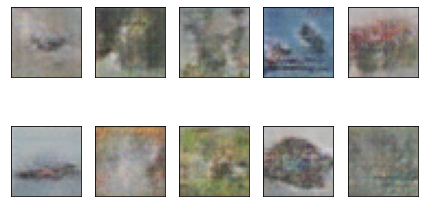

Time for epoch 226 is 23.13118553161621 sec
epoch = 227/400, d_loss=1.375, g_loss=0.714
Time for epoch 227 is 22.601184129714966 sec
epoch = 228/400, d_loss=1.388, g_loss=0.711
Time for epoch 228 is 22.587650060653687 sec
epoch = 229/400, d_loss=1.362, g_loss=0.723
Time for epoch 229 is 22.54254126548767 sec
epoch = 230/400, d_loss=1.385, g_loss=0.736
Time for epoch 230 is 22.891388177871704 sec
epoch = 231/400, d_loss=1.364, g_loss=0.705


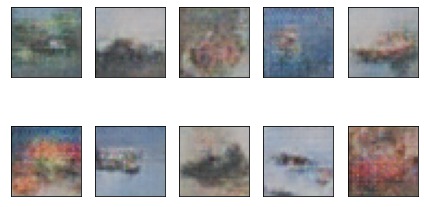

Time for epoch 231 is 23.180042505264282 sec
epoch = 232/400, d_loss=1.378, g_loss=0.709
Time for epoch 232 is 22.541247606277466 sec
epoch = 233/400, d_loss=1.384, g_loss=0.714
Time for epoch 233 is 22.527334451675415 sec
epoch = 234/400, d_loss=1.373, g_loss=0.730
Time for epoch 234 is 22.546833992004395 sec
epoch = 235/400, d_loss=1.400, g_loss=0.699
Time for epoch 235 is 22.51372480392456 sec
epoch = 236/400, d_loss=1.366, g_loss=0.705


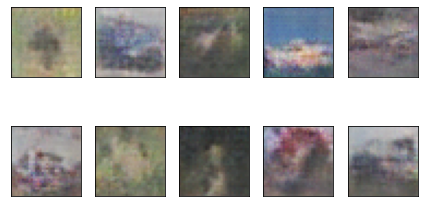

Time for epoch 236 is 22.82987380027771 sec
epoch = 237/400, d_loss=1.386, g_loss=0.729
Time for epoch 237 is 22.527723789215088 sec
epoch = 238/400, d_loss=1.378, g_loss=0.717
Time for epoch 238 is 22.51218271255493 sec
epoch = 239/400, d_loss=1.379, g_loss=0.704
Time for epoch 239 is 22.75755548477173 sec
epoch = 240/400, d_loss=1.364, g_loss=0.711
Time for epoch 240 is 22.449215173721313 sec
epoch = 241/400, d_loss=1.392, g_loss=0.690


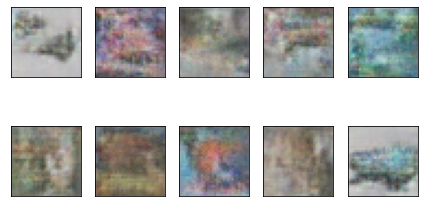

Time for epoch 241 is 22.885697603225708 sec
epoch = 242/400, d_loss=1.384, g_loss=0.703
Time for epoch 242 is 22.660433053970337 sec
epoch = 243/400, d_loss=1.363, g_loss=0.727
Time for epoch 243 is 22.416229963302612 sec
epoch = 244/400, d_loss=1.383, g_loss=0.725
Time for epoch 244 is 23.05361819267273 sec
epoch = 245/400, d_loss=1.386, g_loss=0.738
Time for epoch 245 is 22.626293420791626 sec
epoch = 246/400, d_loss=1.367, g_loss=0.716


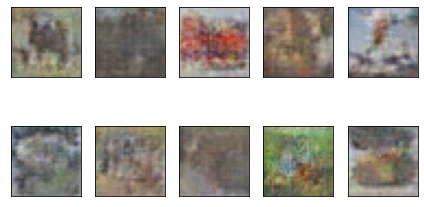

Time for epoch 246 is 22.870954275131226 sec
epoch = 247/400, d_loss=1.388, g_loss=0.699
Time for epoch 247 is 22.561052560806274 sec
epoch = 248/400, d_loss=1.406, g_loss=0.718
Time for epoch 248 is 22.573765993118286 sec
epoch = 249/400, d_loss=1.352, g_loss=0.721
Time for epoch 249 is 22.684972286224365 sec
epoch = 250/400, d_loss=1.388, g_loss=0.701
Time for epoch 250 is 22.537846565246582 sec
epoch = 251/400, d_loss=1.414, g_loss=0.721


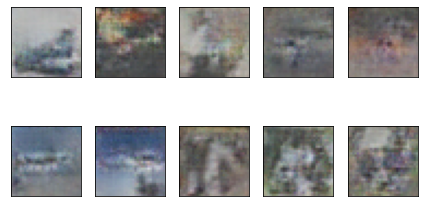

Time for epoch 251 is 23.096577644348145 sec
epoch = 252/400, d_loss=1.375, g_loss=0.719
Time for epoch 252 is 22.51293158531189 sec
epoch = 253/400, d_loss=1.378, g_loss=0.726
Time for epoch 253 is 22.819048643112183 sec
epoch = 254/400, d_loss=1.399, g_loss=0.735
Time for epoch 254 is 22.523495197296143 sec
epoch = 255/400, d_loss=1.399, g_loss=0.719
Time for epoch 255 is 22.55800199508667 sec
epoch = 256/400, d_loss=1.377, g_loss=0.732


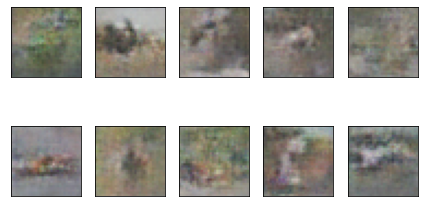

Time for epoch 256 is 22.80373764038086 sec
epoch = 257/400, d_loss=1.395, g_loss=0.734
Time for epoch 257 is 22.541840314865112 sec
epoch = 258/400, d_loss=1.394, g_loss=0.712
Time for epoch 258 is 23.07781410217285 sec
epoch = 259/400, d_loss=1.398, g_loss=0.728
Time for epoch 259 is 22.528433799743652 sec
epoch = 260/400, d_loss=1.356, g_loss=0.724
Time for epoch 260 is 22.629319190979004 sec
epoch = 261/400, d_loss=1.371, g_loss=0.717


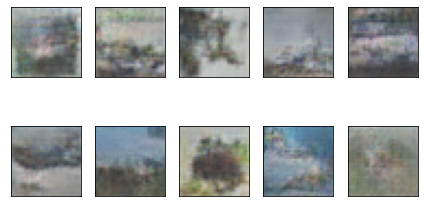

Time for epoch 261 is 22.883771181106567 sec
epoch = 262/400, d_loss=1.404, g_loss=0.722
Time for epoch 262 is 22.574455976486206 sec
epoch = 263/400, d_loss=1.372, g_loss=0.695
Time for epoch 263 is 22.55806851387024 sec
epoch = 264/400, d_loss=1.356, g_loss=0.728
Time for epoch 264 is 22.514819383621216 sec
epoch = 265/400, d_loss=1.378, g_loss=0.717
Time for epoch 265 is 22.515204906463623 sec
epoch = 266/400, d_loss=1.419, g_loss=0.692


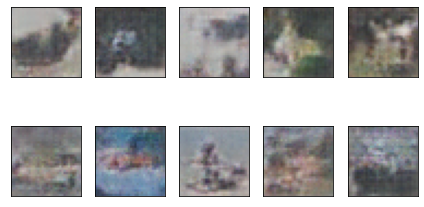

Time for epoch 266 is 23.044633865356445 sec
epoch = 267/400, d_loss=1.397, g_loss=0.717
Time for epoch 267 is 22.686025857925415 sec
epoch = 268/400, d_loss=1.392, g_loss=0.709
Time for epoch 268 is 22.60973334312439 sec
epoch = 269/400, d_loss=1.370, g_loss=0.724
Time for epoch 269 is 22.60870385169983 sec
epoch = 270/400, d_loss=1.404, g_loss=0.712
Time for epoch 270 is 22.692398071289062 sec
epoch = 271/400, d_loss=1.374, g_loss=0.727


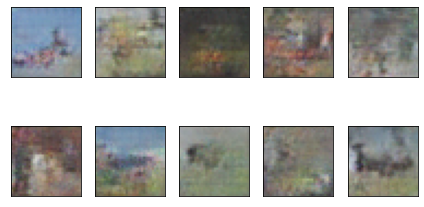

Time for epoch 271 is 23.55423331260681 sec
epoch = 272/400, d_loss=1.336, g_loss=0.734
Time for epoch 272 is 22.855366468429565 sec
epoch = 273/400, d_loss=1.357, g_loss=0.718
Time for epoch 273 is 22.727744340896606 sec
epoch = 274/400, d_loss=1.358, g_loss=0.737
Time for epoch 274 is 22.70080804824829 sec
epoch = 275/400, d_loss=1.385, g_loss=0.719
Time for epoch 275 is 22.597996711730957 sec
epoch = 276/400, d_loss=1.380, g_loss=0.708


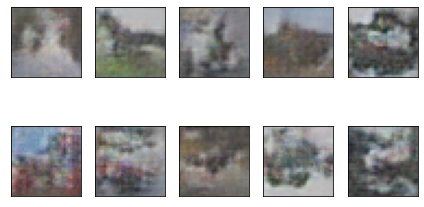

Time for epoch 276 is 22.934954404830933 sec
epoch = 277/400, d_loss=1.368, g_loss=0.708
Time for epoch 277 is 22.895297527313232 sec
epoch = 278/400, d_loss=1.401, g_loss=0.710
Time for epoch 278 is 22.75951075553894 sec
epoch = 279/400, d_loss=1.397, g_loss=0.736
Time for epoch 279 is 22.768033742904663 sec
epoch = 280/400, d_loss=1.378, g_loss=0.702
Time for epoch 280 is 22.88886833190918 sec
epoch = 281/400, d_loss=1.355, g_loss=0.707


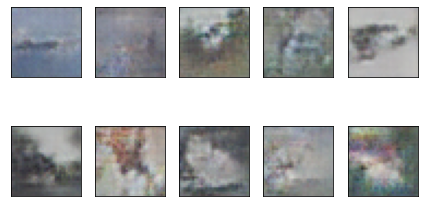

Time for epoch 281 is 23.137892961502075 sec
epoch = 282/400, d_loss=1.385, g_loss=0.721
Time for epoch 282 is 22.673261165618896 sec
epoch = 283/400, d_loss=1.435, g_loss=0.721
Time for epoch 283 is 22.647249698638916 sec
epoch = 284/400, d_loss=1.381, g_loss=0.754
Time for epoch 284 is 22.762766122817993 sec
epoch = 285/400, d_loss=1.367, g_loss=0.711
Time for epoch 285 is 23.122581958770752 sec
epoch = 286/400, d_loss=1.420, g_loss=0.712


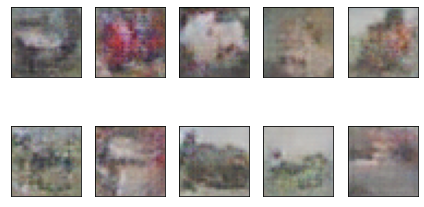

Time for epoch 286 is 22.936339378356934 sec
epoch = 287/400, d_loss=1.359, g_loss=0.713
Time for epoch 287 is 22.657142162322998 sec
epoch = 288/400, d_loss=1.409, g_loss=0.711
Time for epoch 288 is 22.583285331726074 sec
epoch = 289/400, d_loss=1.388, g_loss=0.731
Time for epoch 289 is 22.575002431869507 sec
epoch = 290/400, d_loss=1.361, g_loss=0.704
Time for epoch 290 is 22.624683380126953 sec
epoch = 291/400, d_loss=1.395, g_loss=0.709


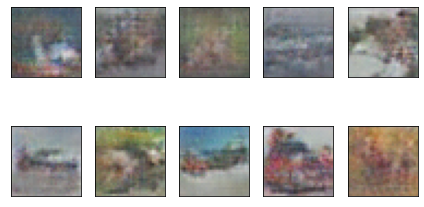

Time for epoch 291 is 23.308140516281128 sec
epoch = 292/400, d_loss=1.382, g_loss=0.731
Time for epoch 292 is 22.63994550704956 sec
epoch = 293/400, d_loss=1.358, g_loss=0.724
Time for epoch 293 is 22.73164391517639 sec
epoch = 294/400, d_loss=1.362, g_loss=0.728
Time for epoch 294 is 22.490248918533325 sec
epoch = 295/400, d_loss=1.388, g_loss=0.695
Time for epoch 295 is 22.677151441574097 sec
epoch = 296/400, d_loss=1.356, g_loss=0.764


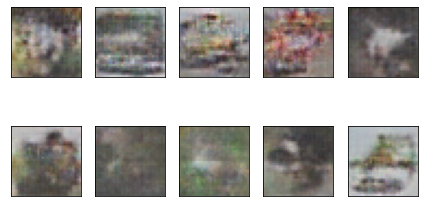

Time for epoch 296 is 22.856249570846558 sec
epoch = 297/400, d_loss=1.353, g_loss=0.722
Time for epoch 297 is 22.599026441574097 sec
epoch = 298/400, d_loss=1.373, g_loss=0.726
Time for epoch 298 is 22.604527235031128 sec
epoch = 299/400, d_loss=1.365, g_loss=0.727
Time for epoch 299 is 22.99114465713501 sec
epoch = 300/400, d_loss=1.367, g_loss=0.720
Time for epoch 300 is 22.597734212875366 sec
epoch = 301/400, d_loss=1.377, g_loss=0.708


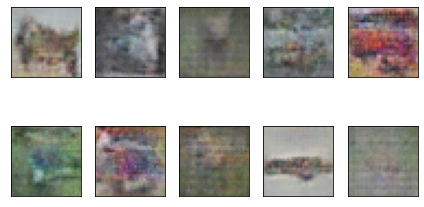

Time for epoch 301 is 22.80179452896118 sec
epoch = 302/400, d_loss=1.360, g_loss=0.723
Time for epoch 302 is 22.657779932022095 sec
epoch = 303/400, d_loss=1.364, g_loss=0.735
Time for epoch 303 is 22.481285572052002 sec
epoch = 304/400, d_loss=1.379, g_loss=0.705
Time for epoch 304 is 22.483293056488037 sec
epoch = 305/400, d_loss=1.384, g_loss=0.710
Time for epoch 305 is 22.54648780822754 sec
epoch = 306/400, d_loss=1.405, g_loss=0.727


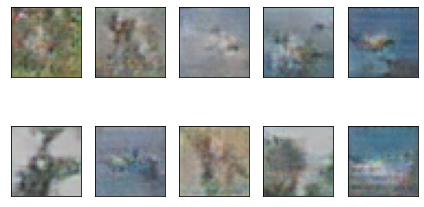

Time for epoch 306 is 22.863826751708984 sec
epoch = 307/400, d_loss=1.407, g_loss=0.705
Time for epoch 307 is 22.66630530357361 sec
epoch = 308/400, d_loss=1.393, g_loss=0.709
Time for epoch 308 is 22.59408926963806 sec
epoch = 309/400, d_loss=1.355, g_loss=0.717
Time for epoch 309 is 22.573129415512085 sec
epoch = 310/400, d_loss=1.372, g_loss=0.700
Time for epoch 310 is 22.509884119033813 sec
epoch = 311/400, d_loss=1.339, g_loss=0.726


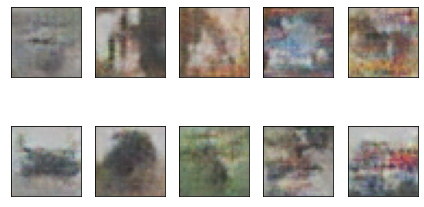

Time for epoch 311 is 23.057100772857666 sec
epoch = 312/400, d_loss=1.379, g_loss=0.699
Time for epoch 312 is 22.831416606903076 sec
epoch = 313/400, d_loss=1.384, g_loss=0.740
Time for epoch 313 is 22.70238971710205 sec
epoch = 314/400, d_loss=1.379, g_loss=0.729
Time for epoch 314 is 22.40596318244934 sec
epoch = 315/400, d_loss=1.393, g_loss=0.699
Time for epoch 315 is 22.4544894695282 sec
epoch = 316/400, d_loss=1.370, g_loss=0.717


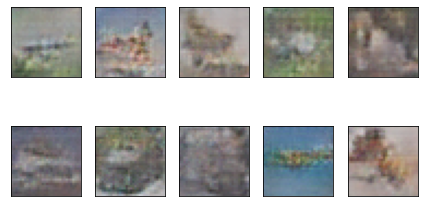

Time for epoch 316 is 22.863367319107056 sec
epoch = 317/400, d_loss=1.379, g_loss=0.709
Time for epoch 317 is 22.47174334526062 sec
epoch = 318/400, d_loss=1.396, g_loss=0.725
Time for epoch 318 is 22.522382974624634 sec
epoch = 319/400, d_loss=1.366, g_loss=0.726
Time for epoch 319 is 22.3746280670166 sec
epoch = 320/400, d_loss=1.379, g_loss=0.717
Time for epoch 320 is 22.76048994064331 sec
epoch = 321/400, d_loss=1.379, g_loss=0.732


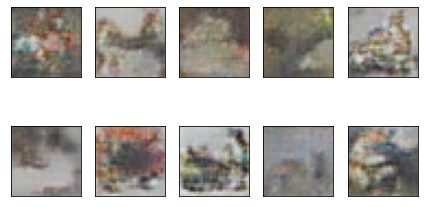

Time for epoch 321 is 22.865992307662964 sec
epoch = 322/400, d_loss=1.374, g_loss=0.706
Time for epoch 322 is 22.55149745941162 sec
epoch = 323/400, d_loss=1.370, g_loss=0.731
Time for epoch 323 is 22.64512324333191 sec
epoch = 324/400, d_loss=1.396, g_loss=0.692
Time for epoch 324 is 22.468454599380493 sec
epoch = 325/400, d_loss=1.367, g_loss=0.717
Time for epoch 325 is 22.402663469314575 sec
epoch = 326/400, d_loss=1.391, g_loss=0.725


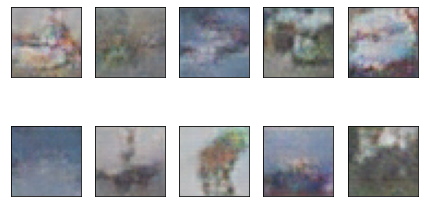

Time for epoch 326 is 23.206580877304077 sec
epoch = 327/400, d_loss=1.356, g_loss=0.730
Time for epoch 327 is 22.606256246566772 sec
epoch = 328/400, d_loss=1.371, g_loss=0.715
Time for epoch 328 is 22.477097511291504 sec
epoch = 329/400, d_loss=1.359, g_loss=0.700
Time for epoch 329 is 22.41650700569153 sec
epoch = 330/400, d_loss=1.396, g_loss=0.700
Time for epoch 330 is 22.557772397994995 sec
epoch = 331/400, d_loss=1.396, g_loss=0.715


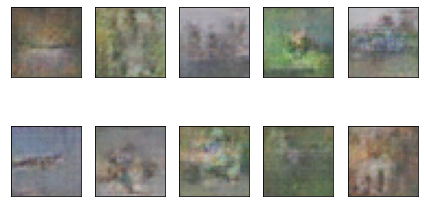

Time for epoch 331 is 23.021164655685425 sec
epoch = 332/400, d_loss=1.355, g_loss=0.699
Time for epoch 332 is 22.52486753463745 sec
epoch = 333/400, d_loss=1.421, g_loss=0.718
Time for epoch 333 is 22.51670217514038 sec
epoch = 334/400, d_loss=1.401, g_loss=0.728
Time for epoch 334 is 22.688037395477295 sec
epoch = 335/400, d_loss=1.401, g_loss=0.670
Time for epoch 335 is 22.35399842262268 sec
epoch = 336/400, d_loss=1.385, g_loss=0.723


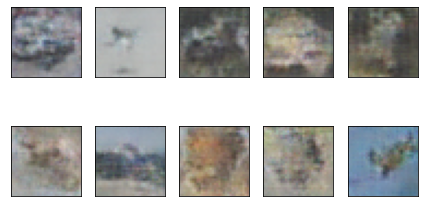

Time for epoch 336 is 22.779401302337646 sec
epoch = 337/400, d_loss=1.359, g_loss=0.749
Time for epoch 337 is 22.546876907348633 sec
epoch = 338/400, d_loss=1.371, g_loss=0.720
Time for epoch 338 is 22.466355562210083 sec
epoch = 339/400, d_loss=1.388, g_loss=0.730
Time for epoch 339 is 22.46900463104248 sec
epoch = 340/400, d_loss=1.390, g_loss=0.699
Time for epoch 340 is 22.903900146484375 sec
epoch = 341/400, d_loss=1.397, g_loss=0.705


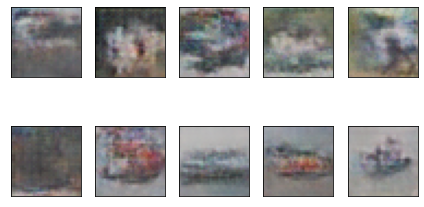

Time for epoch 341 is 22.938347816467285 sec
epoch = 342/400, d_loss=1.355, g_loss=0.725
Time for epoch 342 is 22.505226850509644 sec
epoch = 343/400, d_loss=1.358, g_loss=0.719
Time for epoch 343 is 22.34606385231018 sec
epoch = 344/400, d_loss=1.397, g_loss=0.727
Time for epoch 344 is 22.422751665115356 sec
epoch = 345/400, d_loss=1.374, g_loss=0.707
Time for epoch 345 is 22.54751944541931 sec
epoch = 346/400, d_loss=1.375, g_loss=0.734


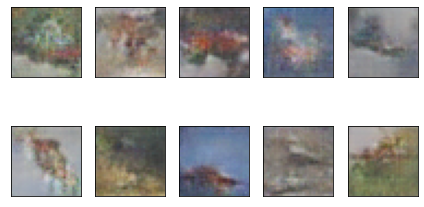

Time for epoch 346 is 22.797909259796143 sec
epoch = 347/400, d_loss=1.394, g_loss=0.737
Time for epoch 347 is 22.75924587249756 sec
epoch = 348/400, d_loss=1.375, g_loss=0.709
Time for epoch 348 is 22.519055604934692 sec
epoch = 349/400, d_loss=1.405, g_loss=0.695
Time for epoch 349 is 22.394919395446777 sec
epoch = 350/400, d_loss=1.391, g_loss=0.718
Time for epoch 350 is 22.517470121383667 sec
epoch = 351/400, d_loss=1.349, g_loss=0.712


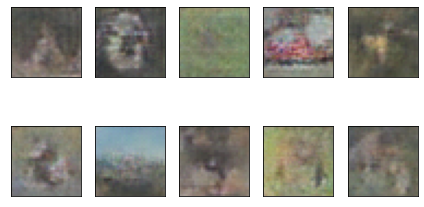

Time for epoch 351 is 22.942057609558105 sec
epoch = 352/400, d_loss=1.390, g_loss=0.729
Time for epoch 352 is 22.56776237487793 sec
epoch = 353/400, d_loss=1.326, g_loss=0.723
Time for epoch 353 is 22.49619174003601 sec
epoch = 354/400, d_loss=1.402, g_loss=0.718
Time for epoch 354 is 22.822640657424927 sec
epoch = 355/400, d_loss=1.365, g_loss=0.738
Time for epoch 355 is 22.623393058776855 sec
epoch = 356/400, d_loss=1.374, g_loss=0.739


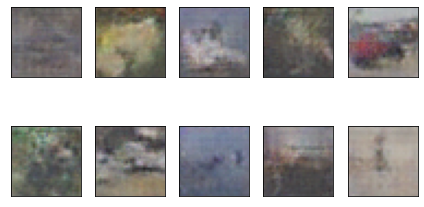

Time for epoch 356 is 22.84303307533264 sec
epoch = 357/400, d_loss=1.366, g_loss=0.744
Time for epoch 357 is 22.43100595474243 sec
epoch = 358/400, d_loss=1.372, g_loss=0.701
Time for epoch 358 is 22.560739040374756 sec
epoch = 359/400, d_loss=1.362, g_loss=0.721
Time for epoch 359 is 22.576160430908203 sec
epoch = 360/400, d_loss=1.390, g_loss=0.718
Time for epoch 360 is 22.48291039466858 sec
epoch = 361/400, d_loss=1.340, g_loss=0.720


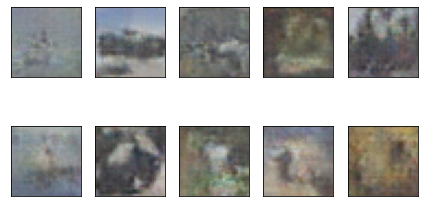

Time for epoch 361 is 22.982017040252686 sec
epoch = 362/400, d_loss=1.386, g_loss=0.705
Time for epoch 362 is 22.57166814804077 sec
epoch = 363/400, d_loss=1.380, g_loss=0.715
Time for epoch 363 is 22.561381340026855 sec
epoch = 364/400, d_loss=1.399, g_loss=0.718
Time for epoch 364 is 22.471177101135254 sec
epoch = 365/400, d_loss=1.408, g_loss=0.709
Time for epoch 365 is 22.547101736068726 sec
epoch = 366/400, d_loss=1.349, g_loss=0.732


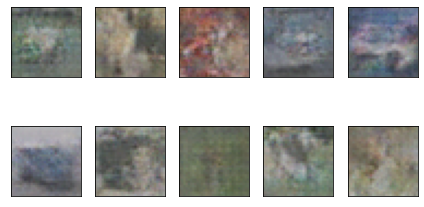

Time for epoch 366 is 22.868474006652832 sec
epoch = 367/400, d_loss=1.360, g_loss=0.713
Time for epoch 367 is 22.849528551101685 sec
epoch = 368/400, d_loss=1.361, g_loss=0.738
Time for epoch 368 is 22.61828923225403 sec
epoch = 369/400, d_loss=1.376, g_loss=0.732
Time for epoch 369 is 22.43963050842285 sec
epoch = 370/400, d_loss=1.384, g_loss=0.707
Time for epoch 370 is 22.496297359466553 sec
epoch = 371/400, d_loss=1.359, g_loss=0.713


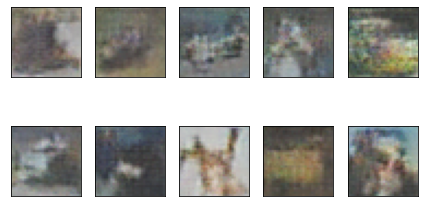

Time for epoch 371 is 23.098451614379883 sec
epoch = 372/400, d_loss=1.349, g_loss=0.714
Time for epoch 372 is 22.4104106426239 sec
epoch = 373/400, d_loss=1.383, g_loss=0.704
Time for epoch 373 is 22.49611258506775 sec
epoch = 374/400, d_loss=1.341, g_loss=0.739
Time for epoch 374 is 22.621881008148193 sec
epoch = 375/400, d_loss=1.370, g_loss=0.706
Time for epoch 375 is 22.350473642349243 sec
epoch = 376/400, d_loss=1.369, g_loss=0.718


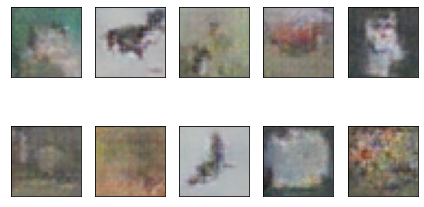

Time for epoch 376 is 22.769245624542236 sec
epoch = 377/400, d_loss=1.362, g_loss=0.715
Time for epoch 377 is 22.562336206436157 sec
epoch = 378/400, d_loss=1.361, g_loss=0.744
Time for epoch 378 is 22.37275242805481 sec
epoch = 379/400, d_loss=1.364, g_loss=0.748
Time for epoch 379 is 22.436286687850952 sec
epoch = 380/400, d_loss=1.358, g_loss=0.716
Time for epoch 380 is 22.644747495651245 sec
epoch = 381/400, d_loss=1.344, g_loss=0.728


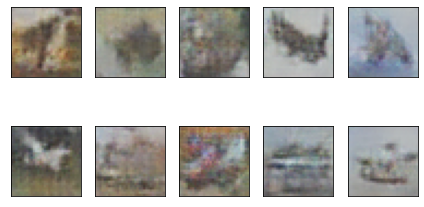

Time for epoch 381 is 23.331401586532593 sec
epoch = 382/400, d_loss=1.407, g_loss=0.734
Time for epoch 382 is 22.453019380569458 sec
epoch = 383/400, d_loss=1.357, g_loss=0.726
Time for epoch 383 is 22.427352905273438 sec
epoch = 384/400, d_loss=1.384, g_loss=0.728
Time for epoch 384 is 22.663651704788208 sec
epoch = 385/400, d_loss=1.398, g_loss=0.714
Time for epoch 385 is 22.413928270339966 sec
epoch = 386/400, d_loss=1.352, g_loss=0.736


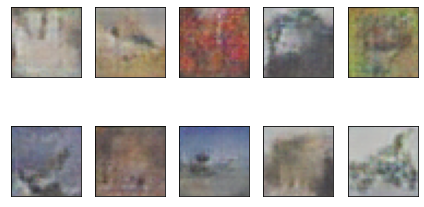

Time for epoch 386 is 22.791624546051025 sec
epoch = 387/400, d_loss=1.380, g_loss=0.726
Time for epoch 387 is 22.60936403274536 sec
epoch = 388/400, d_loss=1.381, g_loss=0.767
Time for epoch 388 is 22.637763261795044 sec
epoch = 389/400, d_loss=1.381, g_loss=0.732
Time for epoch 389 is 22.50010347366333 sec
epoch = 390/400, d_loss=1.348, g_loss=0.753
Time for epoch 390 is 22.73697519302368 sec
epoch = 391/400, d_loss=1.340, g_loss=0.732


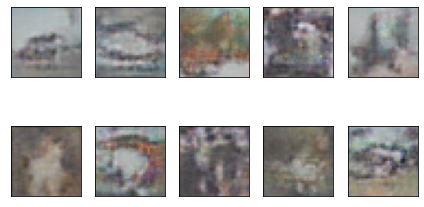

Time for epoch 391 is 22.966521739959717 sec
epoch = 392/400, d_loss=1.350, g_loss=0.721
Time for epoch 392 is 22.53492045402527 sec
epoch = 393/400, d_loss=1.368, g_loss=0.692
Time for epoch 393 is 22.530174016952515 sec
epoch = 394/400, d_loss=1.347, g_loss=0.736
Time for epoch 394 is 22.579150199890137 sec
epoch = 395/400, d_loss=1.375, g_loss=0.722
Time for epoch 395 is 23.141613960266113 sec
epoch = 396/400, d_loss=1.366, g_loss=0.735


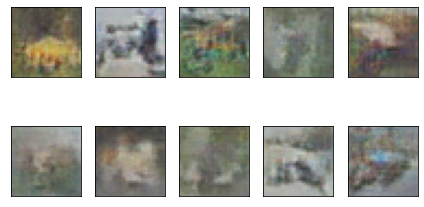

Time for epoch 396 is 22.904329538345337 sec
epoch = 397/400, d_loss=1.385, g_loss=0.739
Time for epoch 397 is 22.51165008544922 sec
epoch = 398/400, d_loss=1.378, g_loss=0.706
Time for epoch 398 is 22.771302938461304 sec
epoch = 399/400, d_loss=1.368, g_loss=0.725
Time for epoch 399 is 22.578409671783447 sec
epoch = 400/400, d_loss=1.395, g_loss=0.707
Time for epoch 400 is 22.441099166870117 sec
x_test2: 10000
Learning rate: 0.005
Epoch 1/200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.00425
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.0036125
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.003070625
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.0026100313
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.0022185266
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0018857475
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.0016028854
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0013624526
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0011580847
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.000984372
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0008367162
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.0007112088
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.0006045275
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0005138483
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.0004367711
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.00037125542
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.00031556713
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00026823205
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00022799724
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00019379765
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.000164728
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.0001400188
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.00011901598
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 0.00010116359
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 8.598905e-05
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 7.309069e-05
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 6.212709e-05
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 5.2808024e-05
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 4.488682e-05
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 3.8153798e-05
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 3.243073e-05
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 2.7566119e-05
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 2.3431201e-05
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 1.991652e-05
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 1.6929043e-05
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 1.4389687e-05
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 1.2231233e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 1.03965485e-05
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 8.837066e-06
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 7.5115063e-06
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 6.38478e-06
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 5.427063e-06
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.613004e-06
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 3.921053e-06
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 3.3328952e-06
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 2.832961e-06
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 2.4080168e-06
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 2.0468142e-06
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 1.7397921e-06
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 1.4788233e-06
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 1.2569998e-06
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 1.0684498e-06
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 9.0818236e-07
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 7.71955e-07
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 6.561618e-07
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 5.577375e-07
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 4.7407687e-07
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 4.0296536e-07
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 3.4252054e-07
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 2.9114247e-07
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 2.474711e-07
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 2.1035042e-07
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 1.7879786e-07
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 1.5197818e-07
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 1.2918146e-07
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 1.0980424e-07
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 9.3333604e-08
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 7.933356e-08
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 6.7433525e-08
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 5.73185e-08
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 4.8720725e-08
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 4.1412616e-08
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 3.5200724e-08
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 2.9920614e-08
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 2.5432522e-08
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 2.1617645e-08
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.8374998e-08
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.5618747e-08
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.3275936e-08
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 1.1284545e-08
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 9.591863e-09
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 8.1530835e-09
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 6.9301214e-09
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 5.890603e-09
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 5.0070126e-09
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 4.255961e-09
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 3.6175667e-09
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 3.0749316e-09
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 2.613692e-09
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 2.2216382e-09
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 1.8883923e-09
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 1.6051336e-09
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 1.3643635e-09
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 1.159709e-09
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 9.857526e-10
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 8.3788976e-10
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 7.122063e-10
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 6.0537536e-10
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 5.1456905e-10
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 4.3738368e-10
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 3.7177614e-10
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 3.1600972e-10
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 2.6860825e-10
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 2.2831702e-10
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 1.9406947e-10
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 1.6495905e-10
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 1.4021519e-10
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 1.1918291e-10
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 1.0130547e-10
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 8.6109654e-11
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 7.31932e-11
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 6.221423e-11
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 5.288209e-11
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 4.4949777e-11
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 3.820731e-11
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 3.2476213e-11
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 2.7604781e-11
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 2.3464064e-11
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.9944454e-11
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.6952786e-11
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.4409868e-11
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.2248388e-11
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 1.041113e-11
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 8.84946e-12
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 7.522041e-12
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 6.3937354e-12
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 5.434675e-12
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 4.6194736e-12
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 3.9265527e-12
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 3.3375698e-12
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 2.8369342e-12
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 2.4113942e-12
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 2.049685e-12
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 1.7422322e-12
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 1.4808974e-12
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 1.2587628e-12
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 1.0699484e-12
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 9.094561e-13
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 7.730377e-13
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 6.5708203e-13
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 5.5851976e-13
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 4.747418e-13
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 4.035305e-13
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 3.4300094e-13
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 2.915508e-13
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 2.4781818e-13
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 2.1064545e-13
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 1.7904863e-13
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 1.5219134e-13
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 1.2936264e-13
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 1.0995824e-13
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 9.346451e-14
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 7.944483e-14
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 6.75281e-14
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 5.739889e-14
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 4.8789057e-14
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 4.14707e-14
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 3.5250093e-14
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.9962578e-14
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.5468192e-14
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 2.1647963e-14
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.840077e-14
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.5640653e-14
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.3294556e-14
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.13003724e-14
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 9.605316e-15
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 8.164519e-15
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 6.939841e-15
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 5.898865e-15
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 5.0140352e-15
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 4.2619297e-15
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 3.6226405e-15
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 3.0792443e-15
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 2.6173576e-15
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 2.224754e-15
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 1.8910409e-15
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 1.6073848e-15
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 1.3662771e-15
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 1.1613355e-15
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 9.871352e-16
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 8.390649e-16
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 7.132052e-16
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 6.062244e-16
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 5.1529075e-16
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 4.3799714e-16
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 3.7229756e-16
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 3.164529e-16
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 2.6898497e-16
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 2.2863725e-16
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 1.9434165e-16
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 1.651904e-16
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 1.4041184e-16
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 1.1935007e-16
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 1.01447555e-16
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 8.623042e-17
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 7.329586e-17
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 6.2301483e-17
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 5.2956258e-17
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 4.501282e-17
Epoch 200/200



Model saved in cifar.hdf5
c test accuracy: 0.8089
c' test accuracy: 0.1


In [13]:
# Step 1: Train a classifier C for CIFAR10 from scratch using (x_train, y_train)
# Step 2: Use x_train to train a GAN with latent dimension = 100 for 200 epochs
# Step 3: Generate 50,000 fake image samples
# Step 4: Use C to produce labels for all fake images
# Step 5: Train a classifier C' from scratch using the fake images and the predicted labels
# Step 6: Compare C and C' on (x_test, y_test)

#CIFAR10 data set contains 50k 32x32 images in the training set, and 10k images in the test set
num_imgs = 50000

# plot random generated fake images 
fig = plt.figure(figsize=(8,3))
for i in range(0, 10):
    plt.subplot(2, 5, 1 + i, xticks=[], yticks=[])
    plt.imshow(x_train[i])
plt.tight_layout()

# # reshape the training input and cast as float32
# print(f"x_train shape: {x_train.shape}, type: {type(x_train)}")

# normalize the training input
x_train = (np.float32(x_train)/255) - 0.5
x_train = tf.data.Dataset.from_tensor_slices(x_train).shuffle(num_imgs).batch(batch_size, drop_remainder=True)

# # get number of batches
# num_batch = num_imgs // batch_size

# define all the models
generator = define_generator()
discriminator = define_discriminator()
gan = define_gan(generator,discriminator)

#train the models
train(g_model=generator, d_model=discriminator, gan_model=gan, dataset=x_train, n_batch=batch_size)
    

# Step 3: Generate 50,000 fake image samples
latent_dim = 100
num_imgs = 50000

# randomly generate 50000 training data set
random_noise = np.random.normal(size=(num_imgs,latent_dim))
random_img = generator.predict_on_batch(random_noise)
x_fake_train = random_img

# randomly generate 10000 testing data set
# random_noise2 = np.random.normal(size=(10000,latent_dim))
# random_img2 = generator.predict_on_batch(random_noise2)

# inspect preditions
# cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
#                    "dog", "frog", "horse", "ship", "truck"]


# Step 4: Use c to produce labels for all fake images
# make test prediction
y_pred_test = model.predict_proba(x_fake_train)
y_pred_test_labels = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)


# cols = 8
# rows = 2
# fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
# for i in range(cols):
#     for j in range(rows):
#         random_index = np.random.randint(0, 50000)
#         ax = fig.add_subplot(rows, cols, i * rows + j + 1)
#         ax.grid(b=False)
#         ax.axis(b=False)
#         ax.imshow(x_fake_train[random_index, :])
#         pred_label = cifar10_classes[y_pred_test_labels[random_index]]
#         pred_proba = y_pred_test_max_probas[random_index]
#         ax.set_title("pred: {}\nscore: {:.3}".format(
#               pred_label, pred_proba
#        ))
# plt.show()

# Step 5: Train a classifier c' from scratch using the fake images and the predicted labels
pred_label = y_pred_test_labels[:]
y_fake_train = pred_label
y_fake_train = np.reshape(y_fake_train,(50000,1))
x_fake_train  = [((x/255) - 0.5) for x in x_fake_train]
x_fake_train = np.array(x_fake_train)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_fake_train)

INIT_LR = 5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model1 = make_model()  # define our model
# model1.summary()

# prepare model for fitting (loss, optimizer, etc)
model1.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.85 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model1.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
model1_filename = 'fake_cifar.{0:03d}.hdf5'
last_finished_epoch = None
print(f"x_test2: {len(x_test2)}")

# fit model
model1.fit(
    x_fake_train, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model1.save_weights("fake_weights.h5")

# x_test for the original classifier c'
y__fake_pred_test = model1.predict_proba(x_test2)
y__fake_pred_test_classes = np.argmax(y__fake_pred_test, axis=1)
y__fake_pred_test_max_probas = np.max(y__fake_pred_test, axis=1)

# Step 6: Compare c and c' on (x_test, y_test)
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))



In [14]:
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))

c test accuracy: 0.8089
c' test accuracy: 0.1


## **Part 5: Visualize Class Activiation Map**

Using the code described in 

https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb 

Implement the class activation map (CAM) to show the parts of the test images above that led your CNN to its final classification decision

In [15]:
from keras.models import load_model

model = load_model('cifar.hdf5')
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_22 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 16, 16, 32)       

Shape of the image: (32, 32, 3)


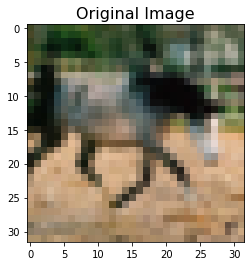

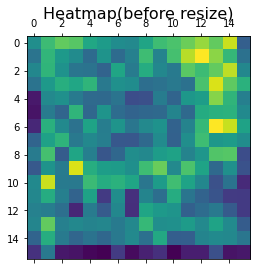

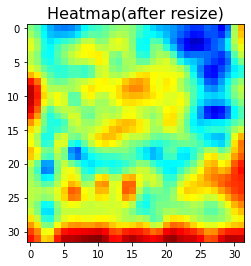

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


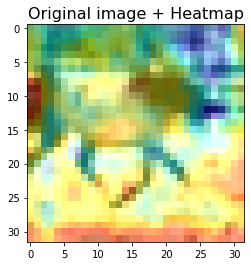

In [16]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Show a horse image x_train[52].
plt.imshow(x_train[52])
plt.title('Original Image', fontsize=16)

# Import the libraries
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import cv2

# Pick a horse image x_train[52] to show the heatmap.
img = x_train[52]
print('Shape of the image:', np.shape(img))

# 'x' is a numpy array of shape (32, 32, 3)
x = image.img_to_array(img)

# A dimension was added to increse the "batch", the dimension of the array is now (1, 32, 32, 3)
x = np.expand_dims(x, axis=0)

# This is the "horse" entry in the prediction vector, 7 is the class of horse
horse = model.output[:, 7]

# This is the output feature map of the 'conv2d_16' layer,
# the last convolutional layer in our architecture
last_conv_layer = model.get_layer('conv2d_16')

# This is the gradient of the "horse" class with regard to
# the output feature map of 'conv2d_16'
grads = K.gradients(horse, last_conv_layer.output)[0]


# This is a vector of shape (64,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# 'pooled_grads' and the output feature map of 'conv2d_16', given a sample image.
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of one horse
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array by "how important this channel is" with regard to the horse class
for i in range(10):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis= -1)

heatmap = np.abs(heatmap)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.title('Heatmap(before resize)', fontsize=16)
plt.show()


# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
#print(np.shape(heatmap),'after resize')
plt.imshow(heatmap)
plt.title('Heatmap(after resize)', fontsize=16)
plt.show()
superimposed_img = heatmap * 0.4 + img

superimposed_img = superimposed_img.astype(int)

# Save the image to disk
plt.imshow(superimposed_img)
plt.title('Original image + Heatmap', fontsize=16)
plt.show()
